Data Visualization Practice Questions _ 100

In [1]:
import matplotlib.pyplot as plt
import pandas as pd 
import seaborn as sns
sns.set()
file = 'job_trends.csv'
df = pd.read_csv(file)

In [2]:
#  Ensure 'date' is in datetime format
df['date'] = pd.to_datetime(df['date'])

In [39]:
print(df.columns)


Index(['id', 'date', 'location', 'unemployment_rate', 'job_postings',
       'in_demand_skills', 'average_age', 'college_degree_percentage'],
      dtype='object')


Line Plots (10 questions)
1. Plot unemployment rate over time for New York
2. Create a multi-line plot comparing job postings trends for 5 major cities
3. Visualize the monthly average job postings across all locations
4. Plot the 30-day moving average of unemployment rate for Chicago
5. Create a line plot showing college_degree_percentage changes over time for San Francisco
6. Plot the cumulative sum of job postings by month
7. Visualize the difference in unemployment rates between two cities over time
8. Create an annotated line plot highlighting peaks in job postings
9. Plot the year-over-year percentage change in job postings
10. Statistical Connection: Calculate and plot the autocorrelation of unemployment rates to check for time series patterns

1. Plot unemployment rate over time for New York

In [40]:
new_york_data = df[df['location'] == 'New York']
print(len(new_york_data))

44


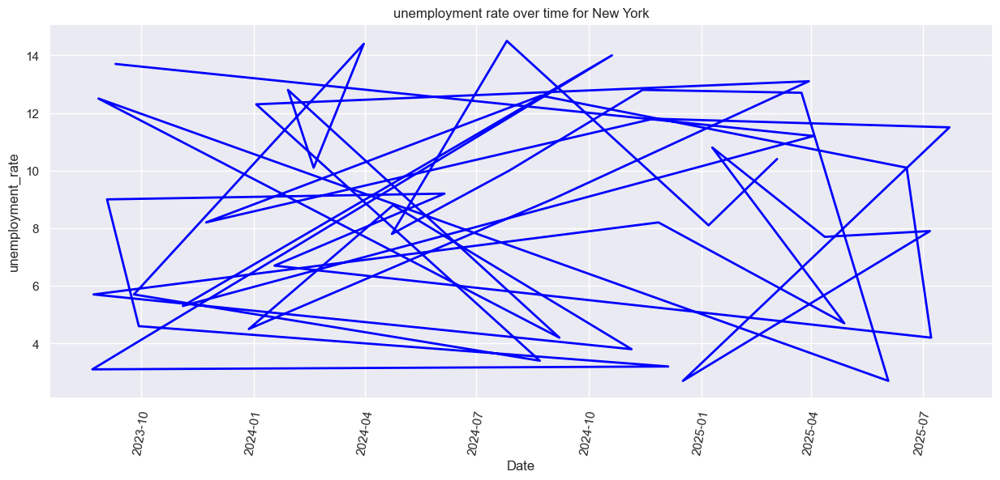

In [41]:
new_york_data = df[df['location'] == 'New York']
plt.figure(figsize=(15,6))
plt.plot(new_york_data['date'],new_york_data['unemployment_rate'],color= 'blue',linewidth = 2)
plt.title('unemployment rate over time for New York')
plt.xlabel("Date")
plt.ylabel("unemployment_rate")
plt.grid(True)
plt.xticks(rotation=80)
plt.show()



2. Create a multi-line plot comparing job postings trends for 5 major cities

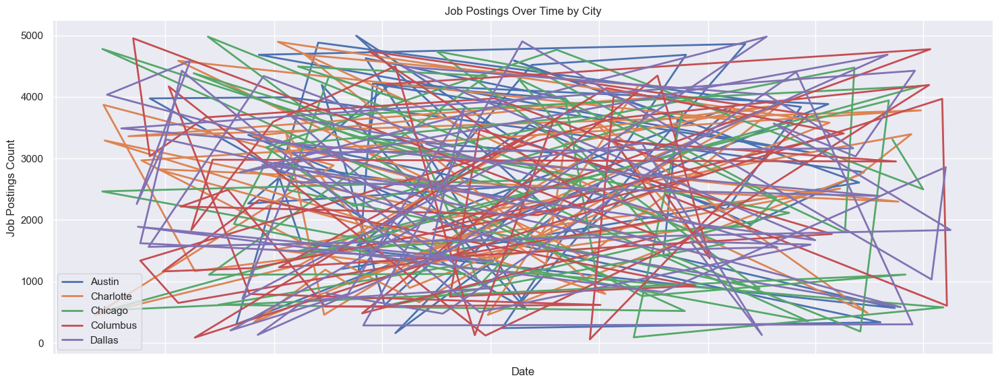

In [42]:
top_five_cities = df.groupby('location')['job_postings'].max().head().index.tolist()
major_cities = df[df['location'].isin(top_five_cities)]
plt.figure(figsize=(15,6))
for city in top_five_cities:
    city_data = major_cities[major_cities['location'] == city]
    plt.plot(city_data['date'], 
             city_data['job_postings'], label = city, linewidth = 2)

plt.title('Job Postings Over Time by City')
plt.xlabel('Date')
plt.ylabel('Job Postings Count')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.gca().set_xticklabels([])

plt.show()

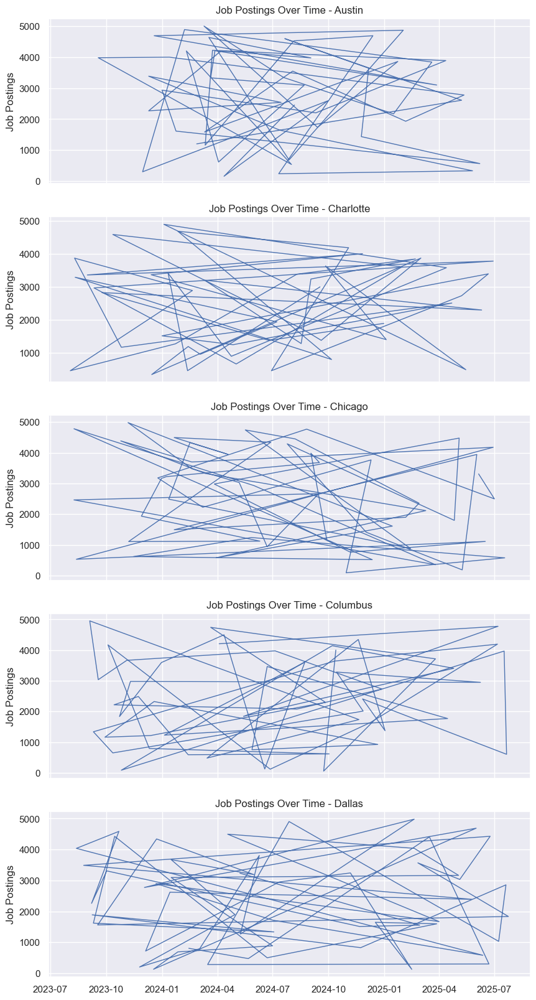

In [43]:
n_cities = len(top_five_cities)

fig, axes = plt.subplots(n_cities, 1, figsize=(10, 4 * n_cities), sharex=True)

for i, city in enumerate(top_five_cities):
    city_data = major_cities[major_cities['location'] == city]
    axes[i].plot(city_data['date'], city_data['job_postings'], linewidth=1)
    axes[i].set_title(f'Job Postings Over Time - {city}')
    axes[i].set_ylabel('Job Postings')
    axes[i].grid(True)

3.Visualize the monthly average job postings across all locations

goal;
a,filter data for each location
b, get the monthly average data from all location

In [44]:

monthly_avg = df.resample('M')['job_postings'].mean()
plt.plot(monthly_avg.index,monthly_avg.values,color='purple',linewidth =1)
plt.title('Monthly Average Job Postings Across All Locations', fontsize=14)
plt.xlabel('Month')
plt.ylabel('Average Job Postings')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

/var/folders/c3/wt5f_c9959z1k4kws7gcpgj00000gn/T/ipykernel_858/2746014825.py:1: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = df.resample('M')['job_postings'].mean()


TypeError: Only valid with DatetimeIndex, TimedeltaIndex or PeriodIndex, but got an instance of 'RangeIndex'

4. Plot the 30-day moving average of unemployment rate for Chicago

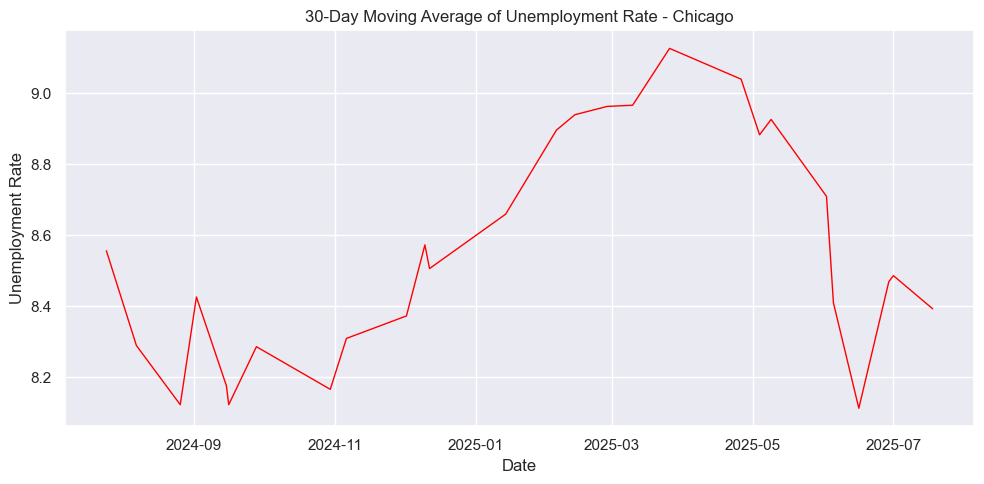

In [ ]:
chicago_data = df[df['location'] == 'Chicago']
chicago_data = chicago_data.sort_values('date')
chicago_data['date'] = pd.to_datetime(chicago_data['date'])
chicago_data.set_index('date', inplace=True)

moving_avg =chicago_data['unemployment_rate'].rolling(window=30).mean()

plt.figure(figsize=(10,5))
plt.plot(moving_avg.index, moving_avg.values, color='red', linewidth=1)
plt.title('30-Day Moving Average of Unemployment Rate - Chicago')
plt.xlabel('Date')
plt.ylabel('Unemployment Rate')
plt.grid(True)
plt.tight_layout()
plt.show()


5. Create a line plot showing college_degree_percentage changes over time for San Francisco

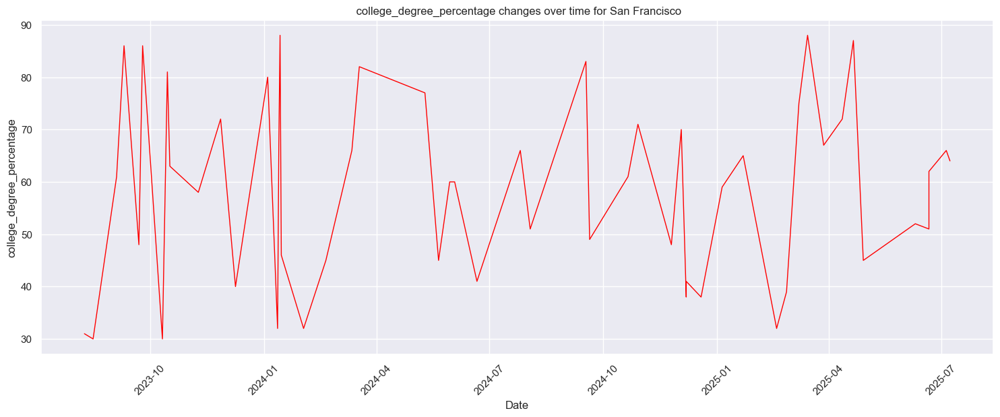

In [ ]:
college_data = df[df['location']=='San Francisco']
college_data = college_data.sort_values('date')
plt.figure(figsize=(15,6))
plt.plot(college_data['date'],college_data['college_degree_percentage'],color='red',linewidth =1)
plt.title(' college_degree_percentage changes over time for San Francisco')
plt.xlabel('Date')
plt.ylabel('college_degree_percentage')
plt.grid(True)
plt.tight_layout()
plt.xticks(rotation =45)
plt.show()


6. Plot the cumulative sum of job postings by month

/var/folders/c3/wt5f_c9959z1k4kws7gcpgj00000gn/T/ipykernel_8447/920113480.py:1: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  job_posting_monthly = df.resample('M')['job_postings'].sum()


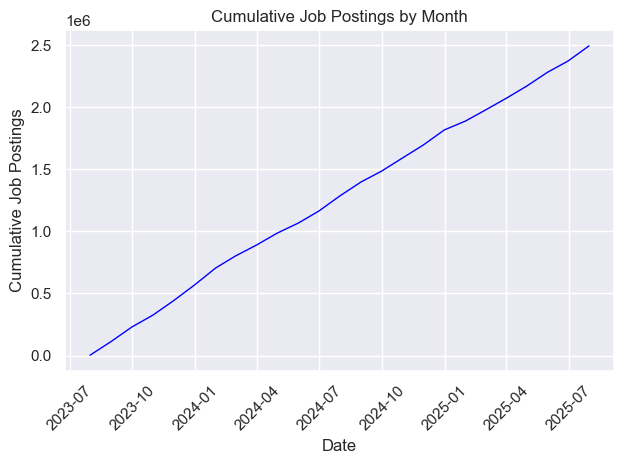

date
2023-07-31       2500
2023-08-31     113042
2023-09-30     228655
2023-10-31     325160
2023-11-30     440183
2023-12-31     567963
2024-01-31     705142
2024-02-29     801824
2024-03-31     890380
2024-04-30     985755
2024-05-31    1066945
2024-06-30    1163390
2024-07-31    1285975
2024-08-31    1398410
2024-09-30    1485491
2024-10-31    1592590
2024-11-30    1695463
2024-12-31    1817754
2025-01-31    1889332
2025-02-28    1974445
2025-03-31    2070486
2025-04-30    2168583
2025-05-31    2281766
2025-06-30    2372215
2025-07-31    2495041
Freq: ME, Name: job_postings, dtype: int64


In [ ]:

job_posting_monthly = df.resample('M')['job_postings'].sum()
cumulative_postings = job_posting_monthly.cumsum().sort_values()
plt.plot(cumulative_postings.index,cumulative_postings.values,color ='blue',linewidth =1)
plt.title('Cumulative Job Postings by Month')
plt.xlabel('Date')
plt.ylabel('Cumulative Job Postings')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()
print(cumulative_postings)

7. Visualize the difference in unemployment rates between two cities over time

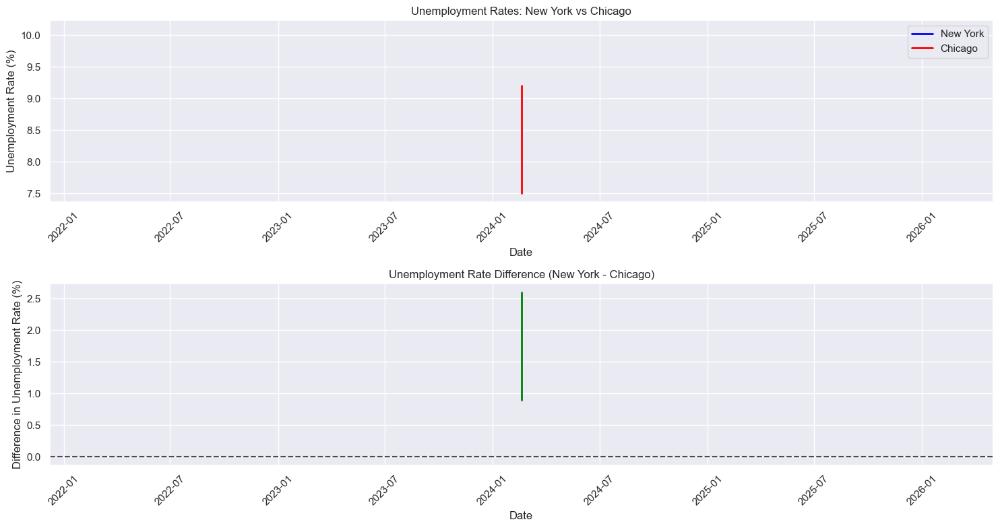

Average difference: 1.75%
Maximum difference: 2.60%
Minimum difference: 0.90%


In [ ]:


ny_data = df[df['location'] == 'New York'].copy()
chicago_data = df[df['location'] == 'Chicago'].copy()


ny_data = ny_data.reset_index()
chicago_data = chicago_data.reset_index()


merged_data = pd.merge(ny_data[['date', 'unemployment_rate']], 
                      chicago_data[['date', 'unemployment_rate']], 
                      on='date', suffixes=('_NY', '_Chicago'))


merged_data['unemployment_diff'] = merged_data['unemployment_rate_NY'] - merged_data['unemployment_rate_Chicago']

plt.figure(figsize=(15, 8))


plt.subplot(2, 1, 1)
plt.plot(merged_data['date'], merged_data['unemployment_rate_NY'], 
         label='New York', color='blue', linewidth=2)
plt.plot(merged_data['date'], merged_data['unemployment_rate_Chicago'], 
         label='Chicago', color='red', linewidth=2)
plt.title('Unemployment Rates: New York vs Chicago')
plt.xlabel('Date')
plt.ylabel('Unemployment Rate (%)')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)


plt.subplot(2, 1, 2)
plt.plot(merged_data['date'], merged_data['unemployment_diff'], 
         color='green', linewidth=2)
plt.axhline(y=0, color='black', linestyle='--', alpha=0.7)
plt.title('Unemployment Rate Difference (New York - Chicago)')
plt.xlabel('Date')
plt.ylabel('Difference in Unemployment Rate (%)')
plt.grid(True)
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()


print(f"Average difference: {merged_data['unemployment_diff'].mean():.2f}%")
print(f"Maximum difference: {merged_data['unemployment_diff'].max():.2f}%")
print(f"Minimum difference: {merged_data['unemployment_diff'].min():.2f}%")

8. Create an annotated line plot highlighting peaks in job postings

/var/folders/c3/wt5f_c9959z1k4kws7gcpgj00000gn/T/ipykernel_1317/1195161479.py:3: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_postings = df['job_postings'].resample('M').sum()


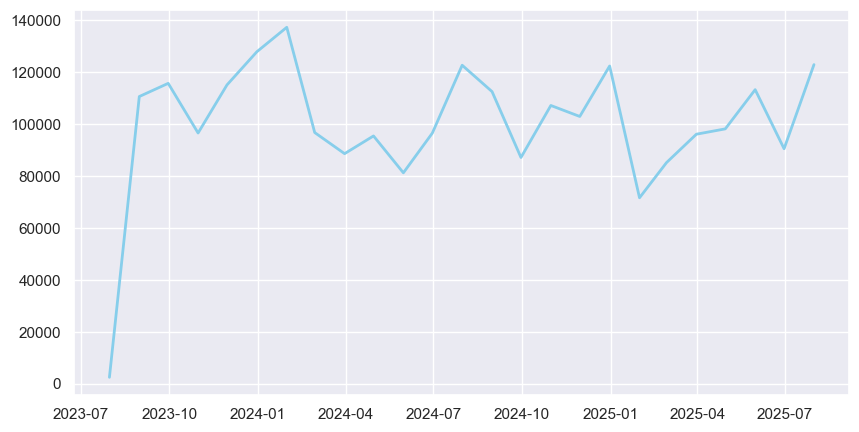

In [ ]:
df.set_index('date', inplace=True)
monthly_postings = df['job_postings'].resample('M').sum()

# Plot the line
plt.figure(figsize=(10, 5))
plt.plot(monthly_postings.index, monthly_postings.values, color='skyblue', linewidth=2, label='Job Postings')


9. Plot the year-over-year percentage change in job postings

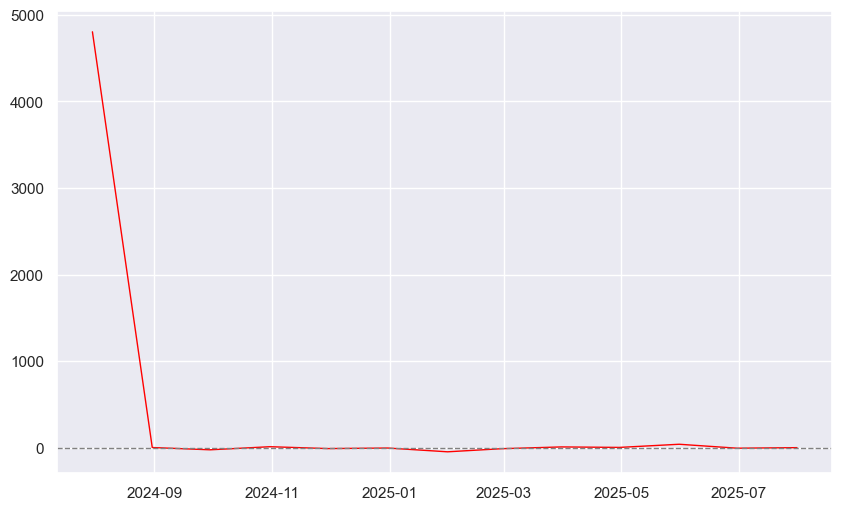

In [ ]:
year_over_change = monthly_postings.pct_change(periods=12) * 100
plt.figure(figsize=(10,6))
plt.plot(year_over_change.index, year_over_change.values, color='red',linewidth=1)
plt.axhline(0, color='gray', linestyle='--', linewidth=1)

10. Statistical Connection: Calculate and plot the autocorrelation of unemployment rates to check for time series patterns


<Figure size 1000x600 with 0 Axes>

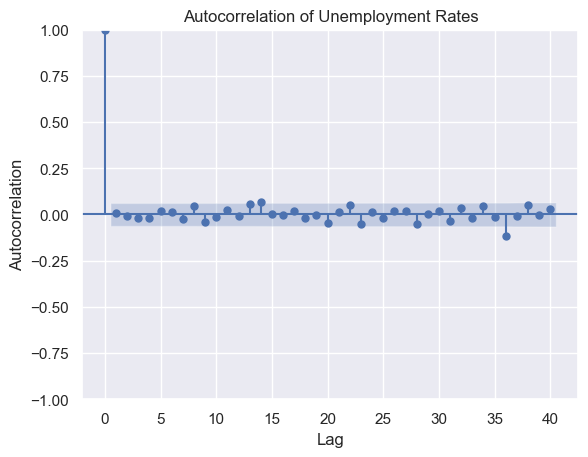

In [ ]:

from statsmodels.graphics.tsaplots import plot_acf
df = df.sort_values('date')
unemployment_rates = df.set_index('date')['unemployment_rate']

# Plot ACF
plt.figure(figsize=(10, 6))
plot_acf(unemployment_rates, lags=40, alpha=0.05)

plt.title='Autocorrelation of Unemployment Rates'
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.grid(True)
plt.show()

Bar Charts (10 questions)
1. Create a bar chart of total job postings by city (top 10)
2. Plot the average unemployment rate by city in descending order
3. Visualize the count of records per year as a bar chart
4. Create a grouped bar chart showing job postings by year for 3 cities
5. Plot the distribution of college_degree_percentage categories
6. Create a stacked bar chart of skill frequencies by city
7. Visualize the maximum unemployment rate recorded for each city
8. Plot the median age of workers by city
9. Create a bar chart comparing 2023 vs 2024 job postings
10. Statistical Connection: Plot the standard deviation of unemployment rates by city to show volatility

1. Create a bar chart of total job postings by city (top 10)

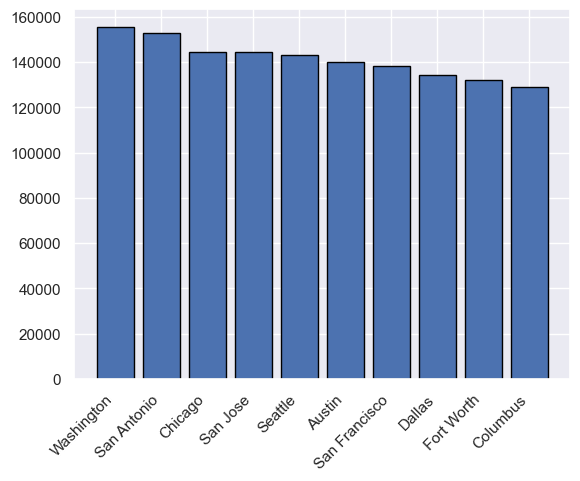

In [ ]:
total_job_postings = df.groupby('location')['job_postings'].sum()
total_job_postings = total_job_postings.nlargest(10)
plt.bar(total_job_postings.index,total_job_postings.values, edgecolor= 'black')
plt.xticks(rotation=45, ha='right')
plt.show()

2. Plot the average unemployment rate by city in descending order

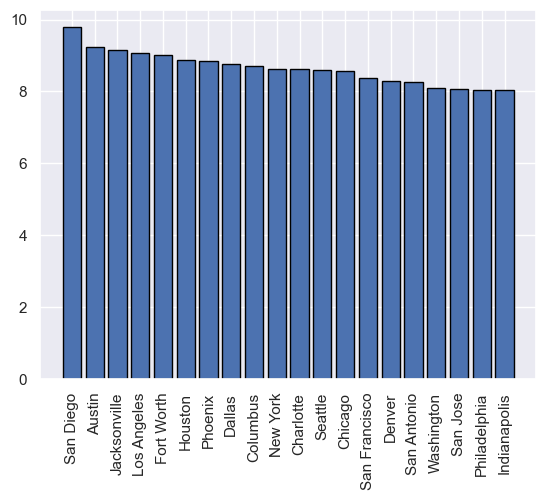

In [ ]:
avg_unemployment = df.groupby('location')['unemployment_rate'].mean().sort_values(ascending=False)
plt.bar(avg_unemployment.index,avg_unemployment.values,edgecolor = 'black')
plt.xticks(rotation=90,)
plt.grid(True)
plt.show()

3. Visualize the count of records per year as a bar chart

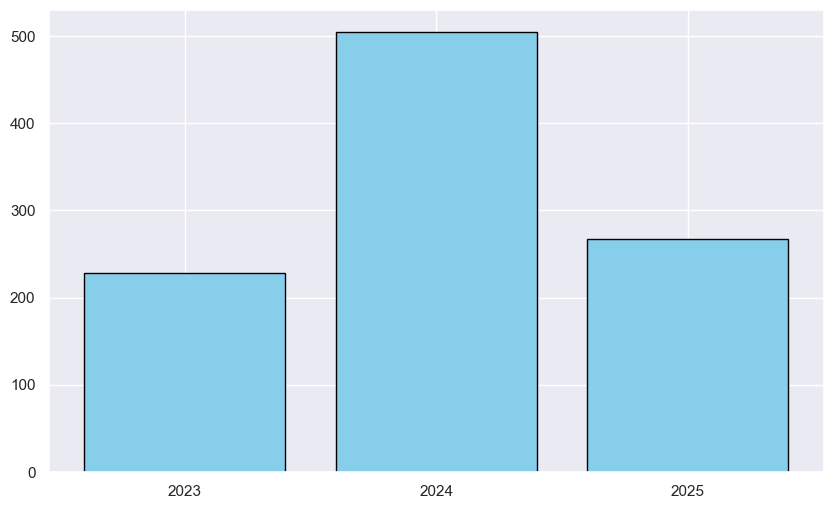

In [ ]:
df['year']=df['date'].dt.year

records_per_year = df['year'].value_counts().sort_index()
plt.figure(figsize=(10,6))
plt.bar(records_per_year.index.astype(str),records_per_year.values,color = 'skyblue',edgecolor='black')
plt.show()

4. Create a grouped bar chart showing job postings by year for 3 cities


<Axes: xlabel='year'>

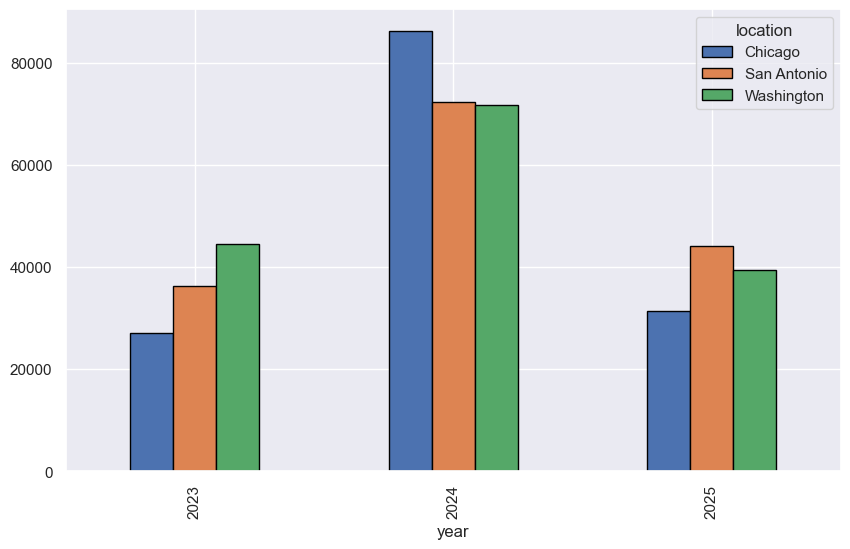

In [ ]:
top_cities = df.groupby('location')['job_postings'].sum().nlargest(3).index
filtered_df = df[df['location'].isin(top_cities)]  #Data
grouped = filtered_df.groupby(['year', 'location'])['job_postings'].sum().unstack()
grouped.plot(kind='bar', figsize=(10, 6), edgecolor='black')

5. Plot the distribution of college_degree_percentage categories
goal = a, create the categories 
b, sort data on that category 
c, plot that data

count    1000.000000
mean       60.608000
std        17.404173
min        30.000000
25%        46.000000
50%        60.000000
75%        75.000000
max        90.000000
Name: college_degree_percentage, dtype: float64


<BarContainer object of 5 artists>

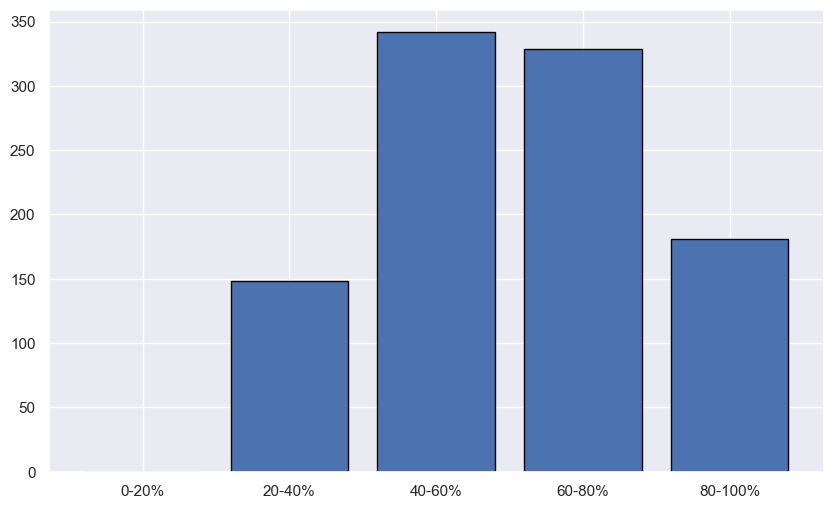

In [ ]:
print(df['college_degree_percentage'].describe())
bins = [0, 20, 40, 60, 80, 100]
labels = ['0-20%', '20-40%', '40-60%', '60-80%', '80-100%']

df['degree_category'] = pd.cut(df['college_degree_percentage'], bins=bins, labels=labels, right=False)
category_counts = df['degree_category'].value_counts().sort_index()
plt.figure(figsize=(10,6))
plt.bar(category_counts.index,category_counts.values,edgecolor='black')

6. Create a stacked bar chart of skill frequencies by city

<Axes: xlabel='location'>

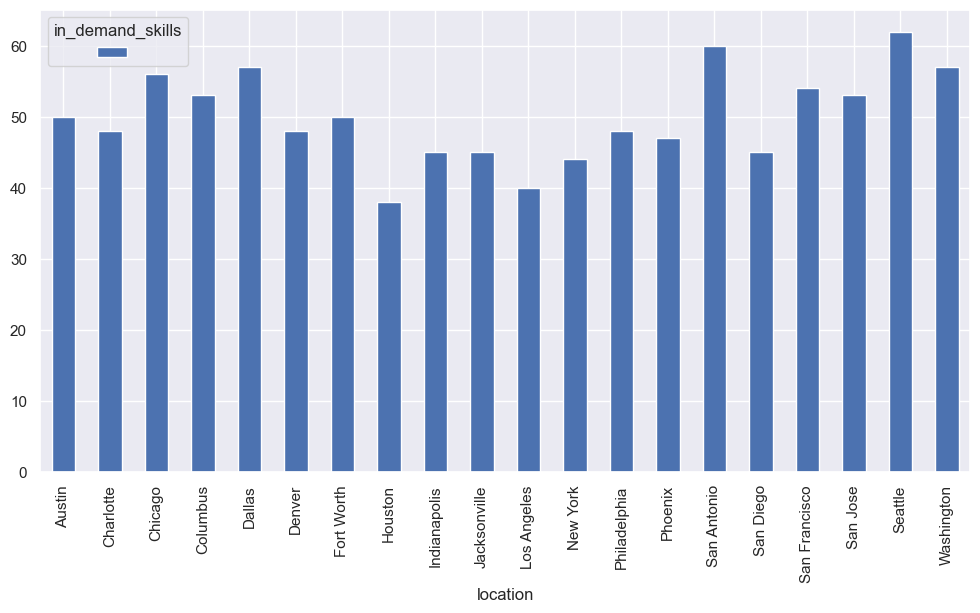

In [ ]:

df['in_demand_skills'] = df['in_demand_skills'].fillna('').astype(str).str.split(',')
df_exploded = df.explode('in_demand_skills')
df_exploded['in_demand_skills'] = df_exploded['in_demand_skills'].str.strip()
skill_by_city = df_exploded.groupby(['location', 'in_demand_skills']).size().unstack(fill_value=0)
skill_by_city.plot(kind='bar', stacked=True, figsize=(12, 6))

7. Visualize the maximum unemployment rate recorded for each city

<Axes: xlabel='location'>

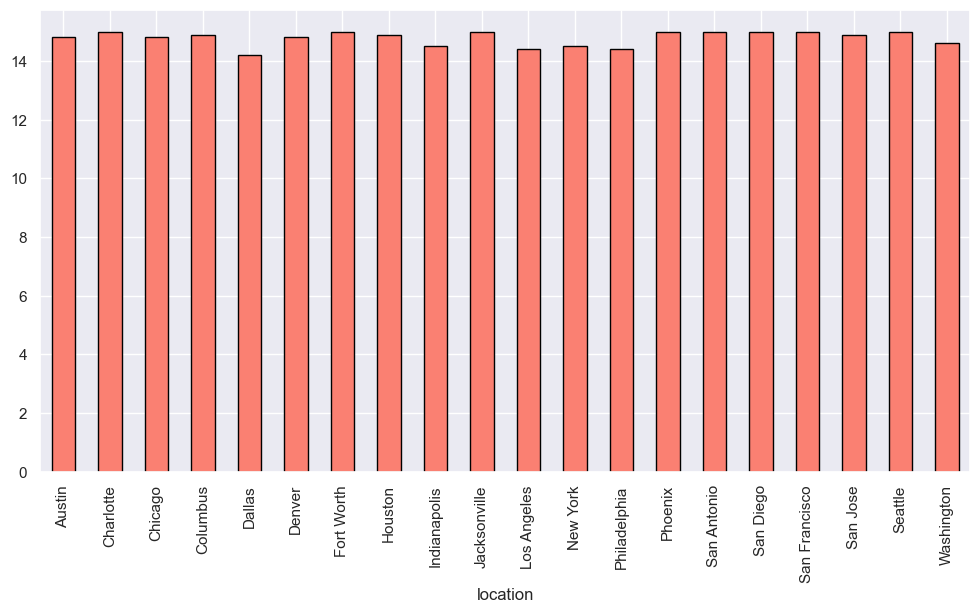

In [ ]:
max_unemployment = df.groupby('location')['unemployment_rate'].max()

max_unemployment.plot(kind ='bar', figsize=(12,6),color='salmon', edgecolor='black')

8. Plot the median age of workers by city

<Axes: xlabel='location'>

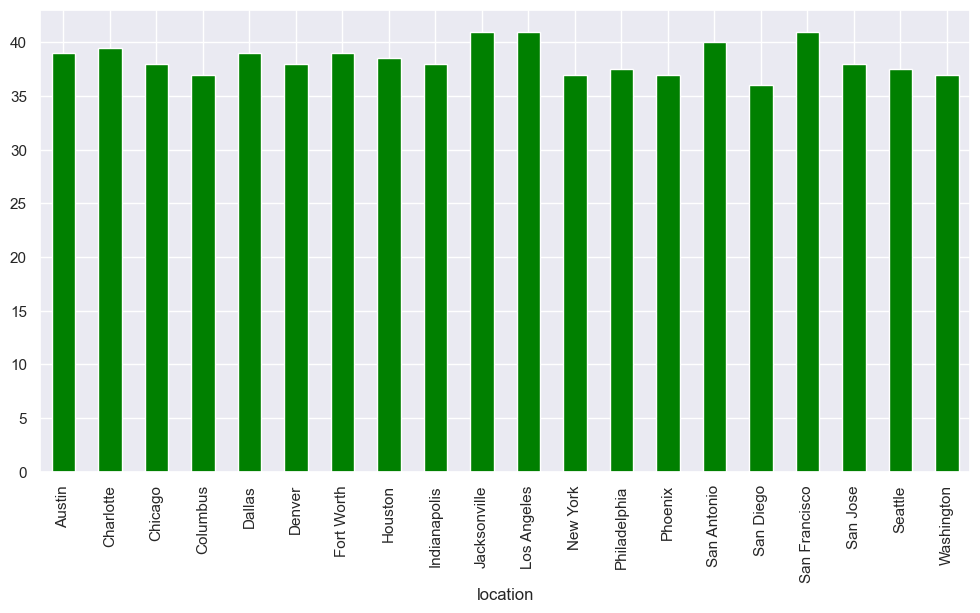

In [ ]:
median_age = df.groupby("location")['average_age'].median()
median_age.plot(kind='bar',figsize=(12,6),color= 'green')


9. Create a bar chart comparing 2023 vs 2024 job postings

<Axes: xlabel='year'>

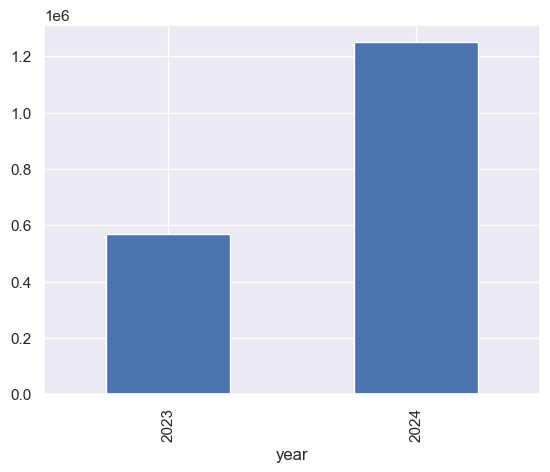

In [ ]:
year_23_24 = df[df['year'].isin([2023,2024])]
two_year_job = year_23_24.groupby('year')['job_postings'].sum()
two_year_job.plot(kind='bar')

10. Statistical Connection: Plot the standard deviation of unemployment rates by city to show volatility

<Axes: xlabel='location'>

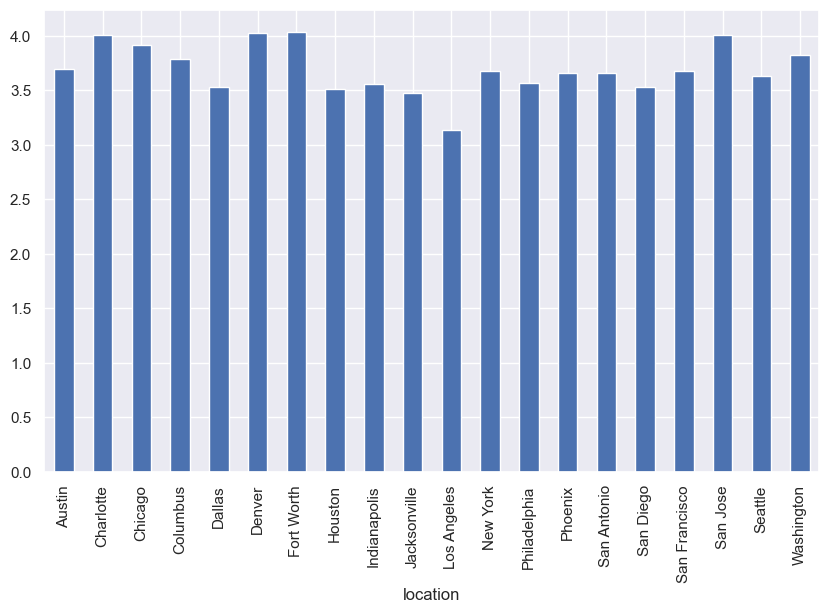

In [ ]:
sd_unemployment_rate = df.groupby("location")['unemployment_rate'].std()
sd_unemployment_rate.plot(kind='bar',figsize=(10,6))
# plt.xticks(rotation=60)

Histograms (10 questions)
1. Create a histogram of unemployment rates with 20 bins
2. Plot the distribution of job postings amounts
3. Visualize the age distribution of workers
4. Create a histogram of college_degree_percentage
5. Plot two histograms (overlaid) of job postings before/after 2025
6. Visualize the distribution of records per month
7. Create a histogram with different colors for high/low unemployment cities
8. Plot the distribution of job postings on log scale
9. Visualize the distribution of average_age by unemployment category
10. Statistical Connection: Fit and plot a normal distribution over your unemployment rate histogram and assess goodness of fit



1. Create a histogram of unemployment rates with 20 bins


Text(0.5, 1.0, 'histogram of unemlpoyment_rate')

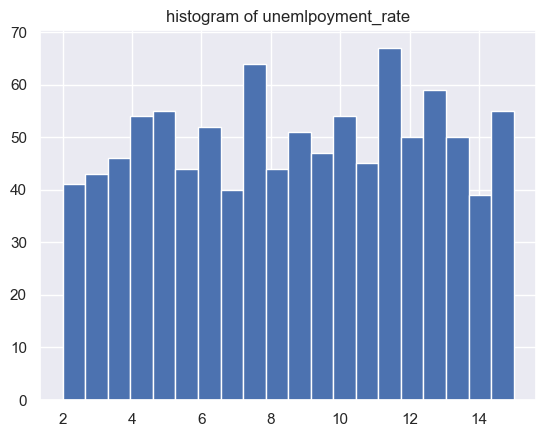

In [ ]:
plt.hist(df['unemployment_rate'],bins = 20)
plt.title('histogram of unemlpoyment_rate')

2. Plot the distribution of job postings amounts

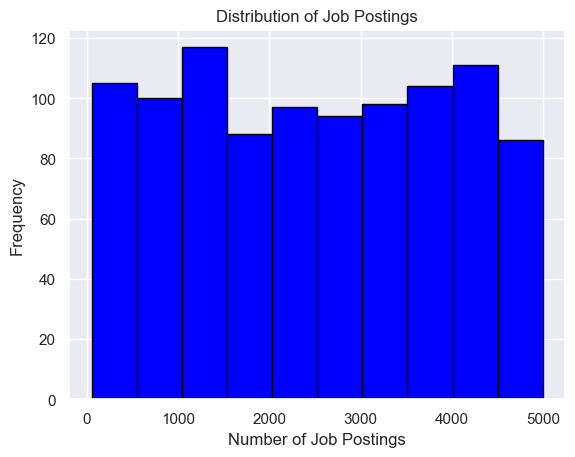

In [ ]:
plt.hist(df['job_postings'], edgecolor='black', color='blue')
plt.title('Distribution of Job Postings')
plt.xlabel('Number of Job Postings')
plt.ylabel('Frequency')
plt.show()

3. Visualize the age distribution of workers

(array([195., 161., 195., 207., 242.]),
 array([25., 30., 35., 40., 45., 50.]),
 <BarContainer object of 5 artists>)

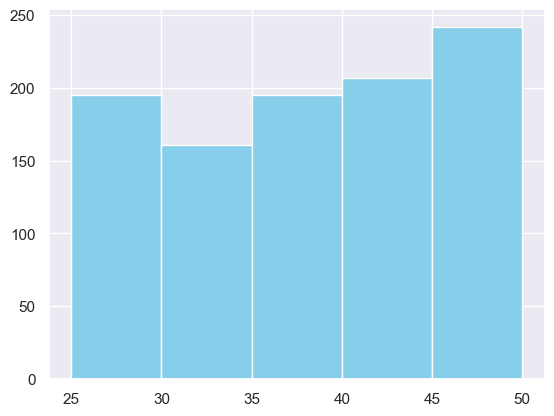

In [ ]:
plt.hist(df['average_age'],bins = 5,
            color='skyblue')


4. Create a histogram of college_degree_percentage

([<matplotlib.axis.XTick at 0x168f8f230>,
 [Text(30, 0, '30'),
  Text(40, 0, '40'),
  Text(50, 0, '50'),
  Text(60, 0, '60'),
  Text(70, 0, '70'),
  Text(80, 0, '80'),
  Text(90, 0, '90')])

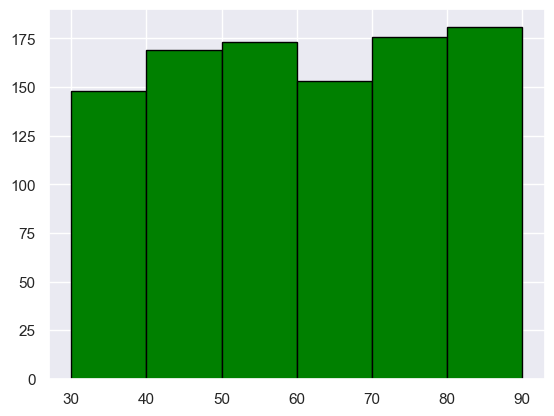

In [ ]:
plt.hist(df['college_degree_percentage'],bins=[30, 40, 50, 60, 70, 80, 90],edgecolor='black',color = 'green')
plt.xticks([30, 40, 50, 60, 70, 80, 90])

5. Plot two histograms (overlaid) of job postings before/after 2025

(array([15., 15., 14.,  7., 19., 14., 14.,  6., 14.,  9., 12., 11., 16.,
        16., 11., 15., 19., 17., 11., 12.]),
 array([  53. ,  299.4,  545.8,  792.2, 1038.6, 1285. , 1531.4, 1777.8,
        2024.2, 2270.6, 2517. , 2763.4, 3009.8, 3256.2, 3502.6, 3749. ,
        3995.4, 4241.8, 4488.2, 4734.6, 4981. ]),
 <BarContainer object of 20 artists>)

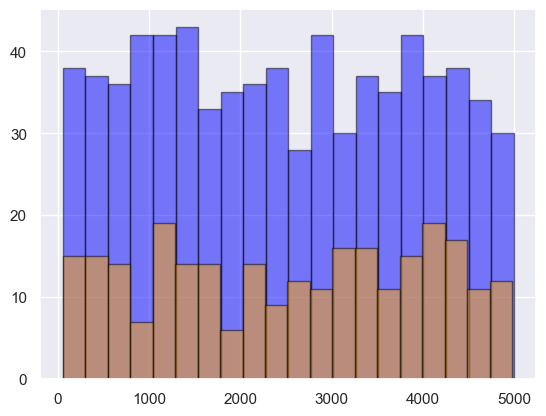

In [ ]:
df['year'] = df['date'].dt.year
before_2025 = df[df['year'] < 2025]['job_postings']
after_2025 = df[df['year'] >= 2025]['job_postings']
plt.hist(before_2025, bins=20, alpha=0.5, label='Before 2025', color='blue', edgecolor='black')
plt.hist(after_2025, bins=20, alpha=0.5, label='2025 & After', color='orange', edgecolor='black')


6. Visualize the distribution of records per month

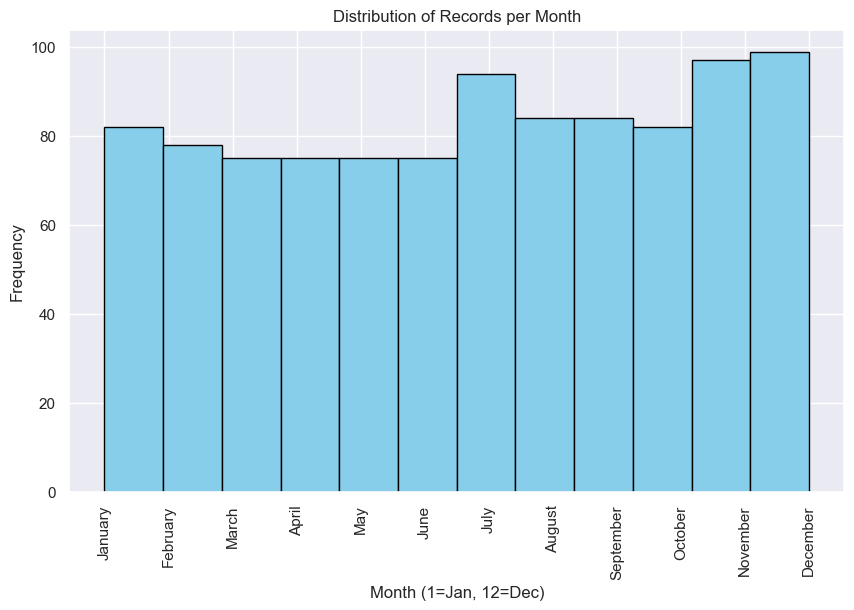

In [ ]:
plt.figure(figsize=(10,6))
plt.hist(df['date'].dt.month, bins=12, color='skyblue', edgecolor='black')
plt.title('Distribution of Records per Month')
plt.xlabel('Month (1=Jan, 12=Dec)')
plt.ylabel('Frequency')
plt.xticks(range(1, 13),['January', 'February', 'March', 'April', 'May', 'June', 
            'July', 'August', 'September', 'October', 'November', 'December'],rotation=
            90)   # Show months 1 to 12
plt.show()


7. Create a histogram with different colors for high/low unemployment cities

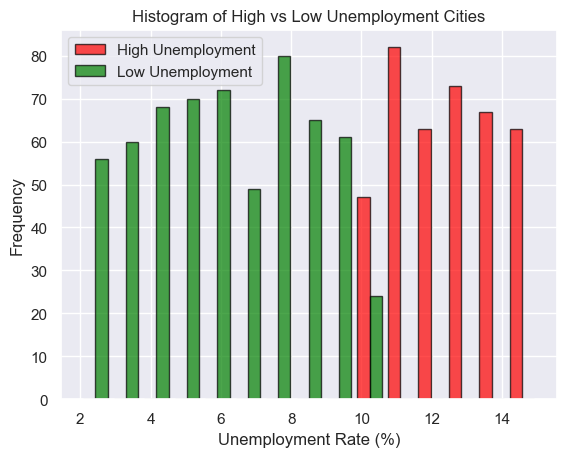

In [ ]:
high_unemp = df[df['unemployment_rate'] > 10]['unemployment_rate']
low_unemp = df[df['unemployment_rate'] <= 10]['unemployment_rate']

plt.hist([high_unemp, low_unemp], bins=15, label=['High Unemployment', 'Low Unemployment'],
         color=['red', 'green'], edgecolor='black', alpha=0.7)

plt.title('Histogram of High vs Low Unemployment Cities')
plt.xlabel('Unemployment Rate (%)')
plt.ylabel('Frequency')
plt.legend()
plt.show()


8. Plot the distribution of job postings on log scale

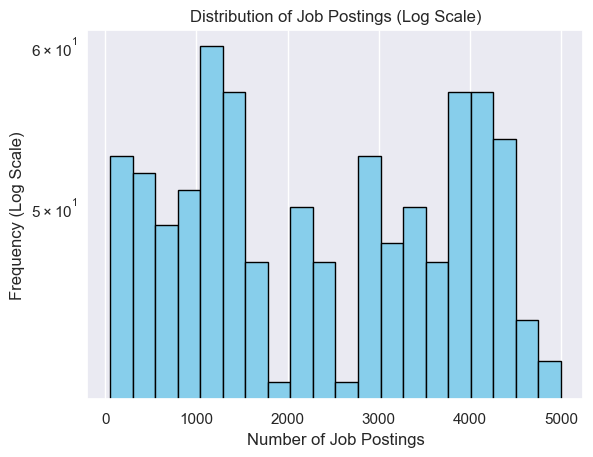

In [ ]:
plt.hist(df['job_postings'], bins=20, color='skyblue', edgecolor='black')
plt.yscale('log') ####
plt.title('Distribution of Job Postings (Log Scale)')
plt.xlabel('Number of Job Postings')
plt.ylabel('Frequency (Log Scale)')
plt.show()


9. Visualize the distribution of average_age by unemployment category


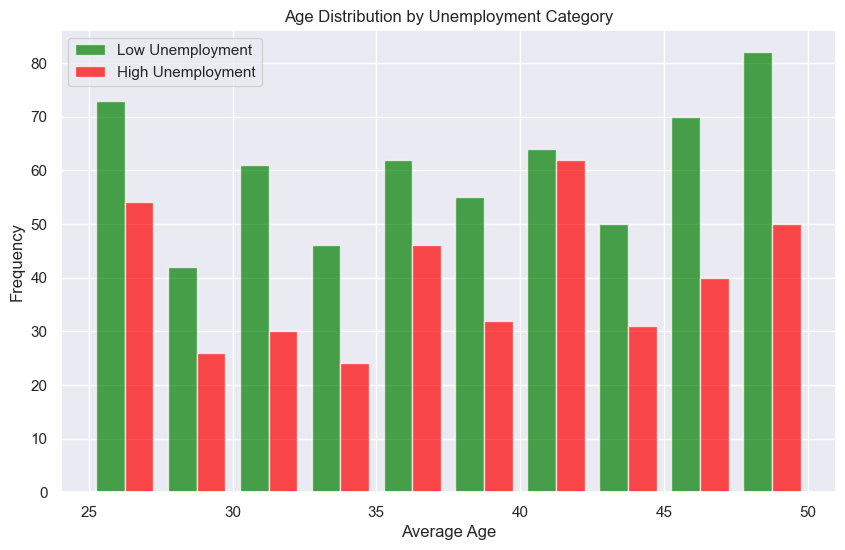

In [ ]:

df['unemp_category'] = pd.cut(df['unemployment_rate'], bins=[0, 10, float('inf')], labels=['Low', 'High'])

low_ages = df[df['unemp_category'] == 'Low']['average_age']
high_ages = df[df['unemp_category'] == 'High']['average_age']

plt.figure(figsize=(10, 6))
plt.hist([low_ages, high_ages], 
         bins=10, 
         alpha=0.7, 
         label=['Low Unemployment', 'High Unemployment'],
         color=['green', 'red'])

plt.title('Age Distribution by Unemployment Category')
plt.xlabel('Average Age')
plt.ylabel('Frequency')
plt.legend()
plt.show()

10. Statistical Connection: Fit and plot a normal distribution over your unemployment rate histogram and assess goodness of fit


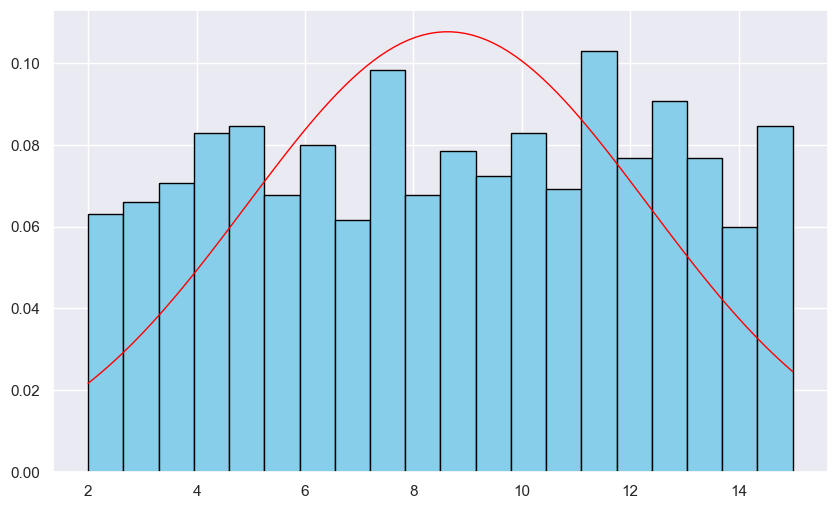

In [ ]:
from scipy.stats import norm
import numpy as np

data = df['unemployment_rate'].dropna()
mu, sigma = norm.fit(data)
plt.figure(figsize=(10,6))
plt.hist(data, bins = 20, density = True, color = 'skyblue', edgecolor = 'black')
x = np.linspace(data.min(),data.max(),100)


plt.plot(x,norm.pdf(x,mu,sigma),'red', linewidth = 1)



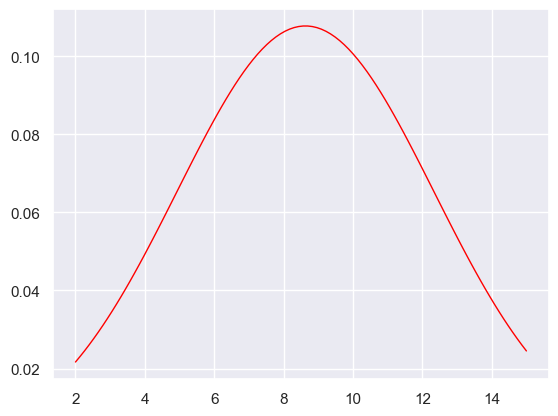

In [ ]:
plt.plot(x,norm.pdf(x,mu,sigma),'red', linewidth = 1)

In [ ]:
from scipy.stats import kstest, norm

mu, sigma = norm.fit(data)
stat, p = kstest(data, 'norm', args=(mu, sigma))
print(f"KS Statistic: {stat:.3f}, p-value: {p:.3f}")


KS Statistic: 0.070, p-value: 0.000


Scatter Plots (10 questions)
1. Plot job_postings vs unemployment_rate
2. Create a scatter plot of average_age vs college_degree_percentage
3. Visualize job_postings vs unemployment_rate colored by city
4. Plot college_degree_percentage vs unemployment_rate with size based on job_postings
5. Create a scatter matrix of numerical variables
6. Visualize the relationship between average_age and job_postings
7. Plot unemployment_rate vs college_degree_percentage with regression line
8. Create a bubble chart with three numerical variables
9. Visualize job_postings vs unemployment_rate with marginal histograms
10. ML Connection: Plot the residuals after fitting a linear regression between job_postings and unemployment_rate

 Plot job_postings vs unemployment_rate

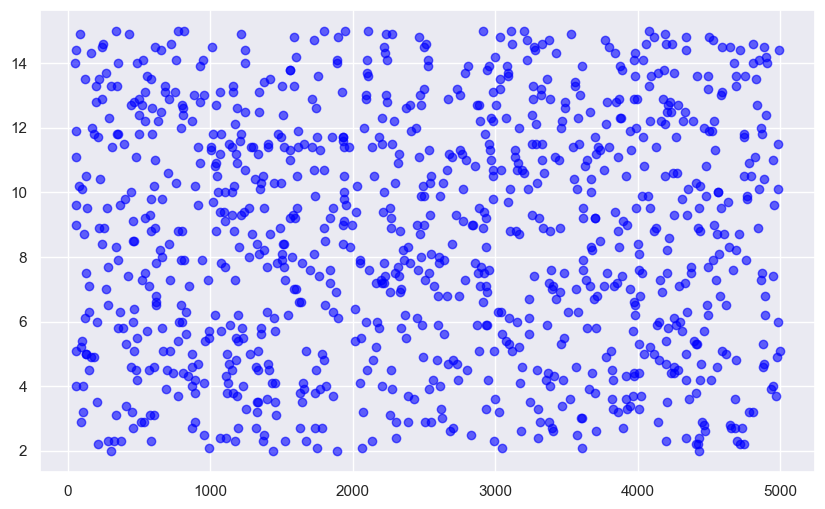

In [ ]:
plt.figure(figsize=(10,6))
plt.scatter(df['job_postings'],df['unemployment_rate'],color = 'blue',alpha = 0.6)

2. Create a scatter plot of average_age vs college_degree_percentage

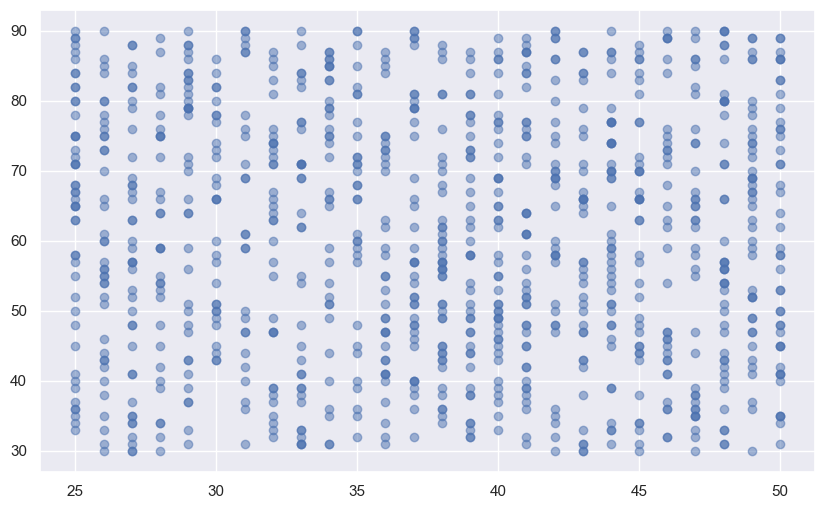

In [ ]:
plt.figure(figsize=(10,6))
plt.scatter(df['average_age'],df['college_degree_percentage'], alpha=0.5)


3. Visualize job_postings vs unemployment_rate colored by city

<Axes: xlabel='unemployment_rate', ylabel='job_postings'>

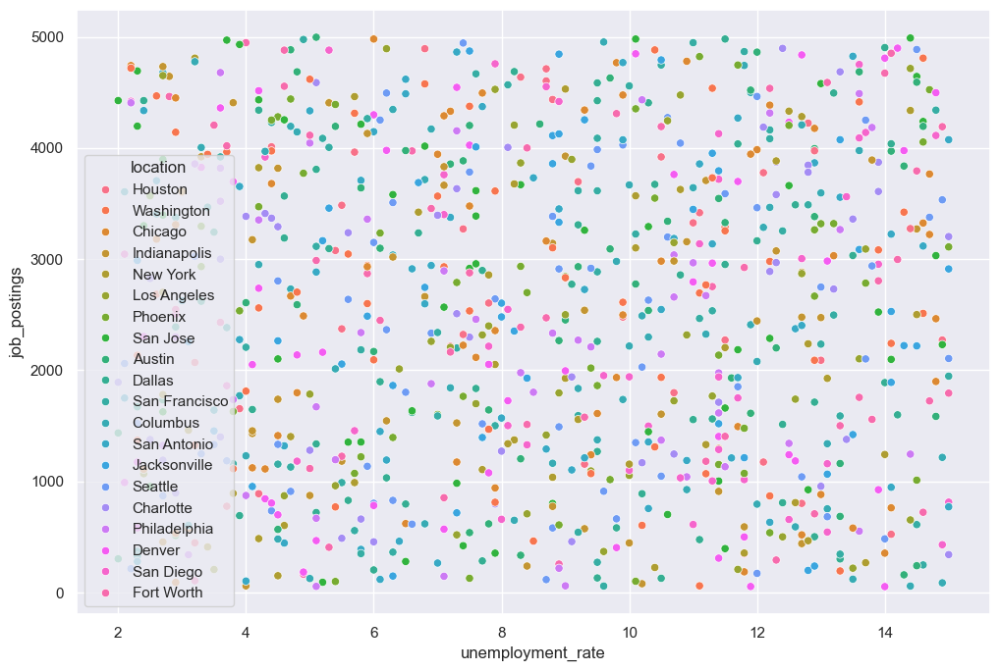

In [ ]:
plt.figure(figsize=(12, 8))
sns.scatterplot( data=df,x='unemployment_rate', y='job_postings',hue='location')


4. Plot college_degree_percentage vs unemployment_rate with size based on job_postings

<Axes: xlabel='college_degree_percentage', ylabel='unemployment_rate'>

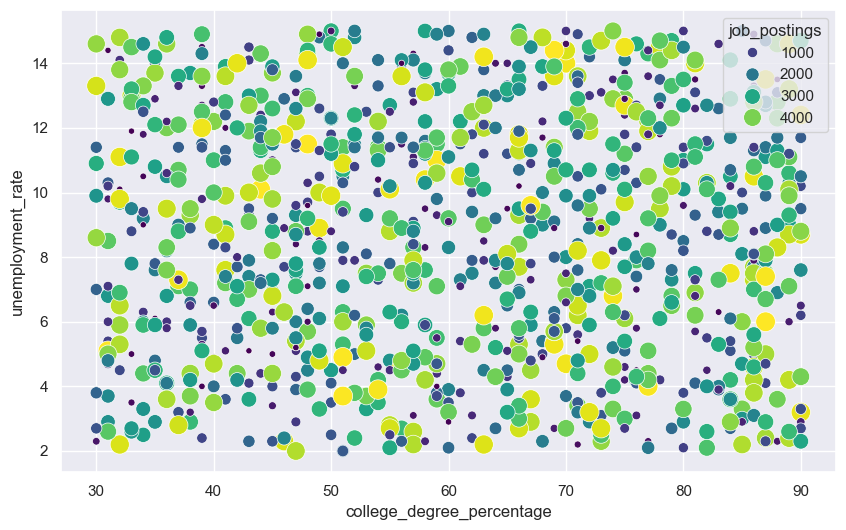

In [ ]:
plt.figure(figsize=(10,6))
sns.scatterplot(data = df, x = 'college_degree_percentage', y = 'unemployment_rate',
                size = 'job_postings', hue = 'job_postings', sizes = (20,200),palette='viridis')

5. Create a scatter matrix of numerical variables

array([[<Axes: xlabel='id', ylabel='id'>,
        <Axes: xlabel='unemployment_rate', ylabel='id'>,
        <Axes: xlabel='job_postings', ylabel='id'>,
        <Axes: xlabel='average_age', ylabel='id'>,
        <Axes: xlabel='college_degree_percentage', ylabel='id'>,
        <Axes: xlabel='year', ylabel='id'>],
       [<Axes: xlabel='id', ylabel='unemployment_rate'>,
        <Axes: xlabel='unemployment_rate', ylabel='unemployment_rate'>,
        <Axes: xlabel='job_postings', ylabel='unemployment_rate'>,
        <Axes: xlabel='average_age', ylabel='unemployment_rate'>,
        <Axes: xlabel='college_degree_percentage', ylabel='unemployment_rate'>,
        <Axes: xlabel='year', ylabel='unemployment_rate'>],
       [<Axes: xlabel='id', ylabel='job_postings'>,
        <Axes: xlabel='unemployment_rate', ylabel='job_postings'>,
        <Axes: xlabel='job_postings', ylabel='job_postings'>,
        <Axes: xlabel='average_age', ylabel='job_postings'>,
        <Axes: xlabel='college_degree_percen

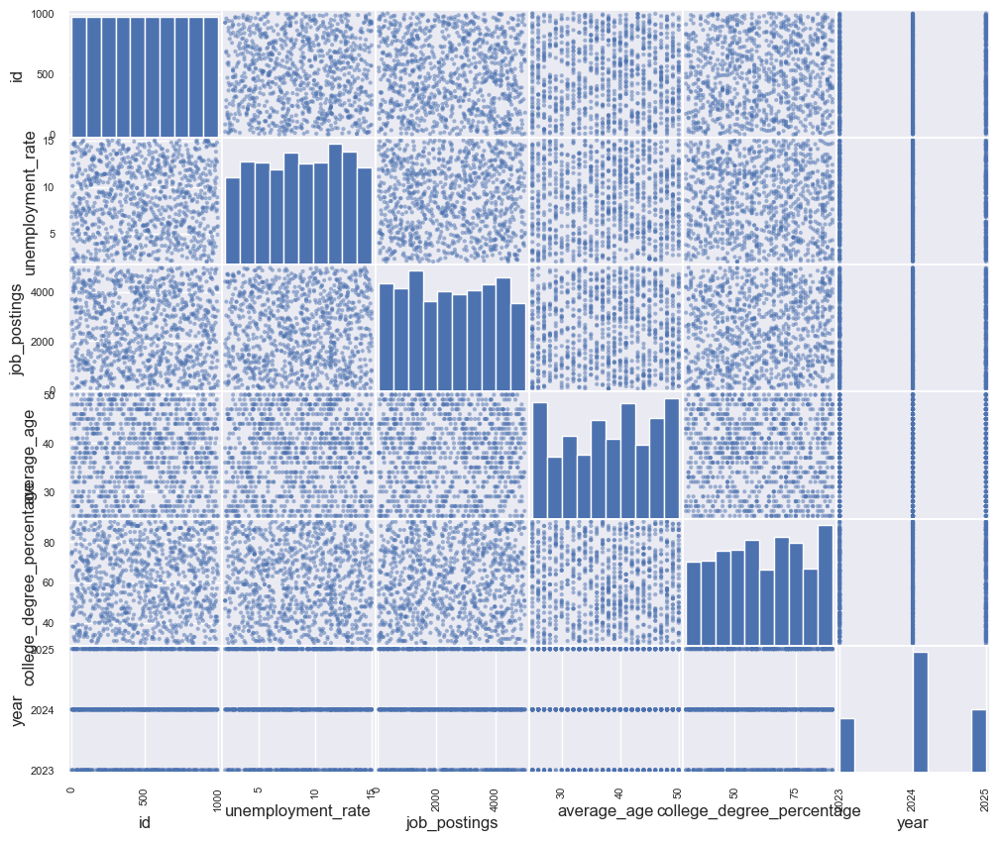

In [ ]:
from pandas.plotting import scatter_matrix
numeric_df = df.select_dtypes(include='number')
scatter_matrix(numeric_df,figsize=(12,10),diagonal='hist')

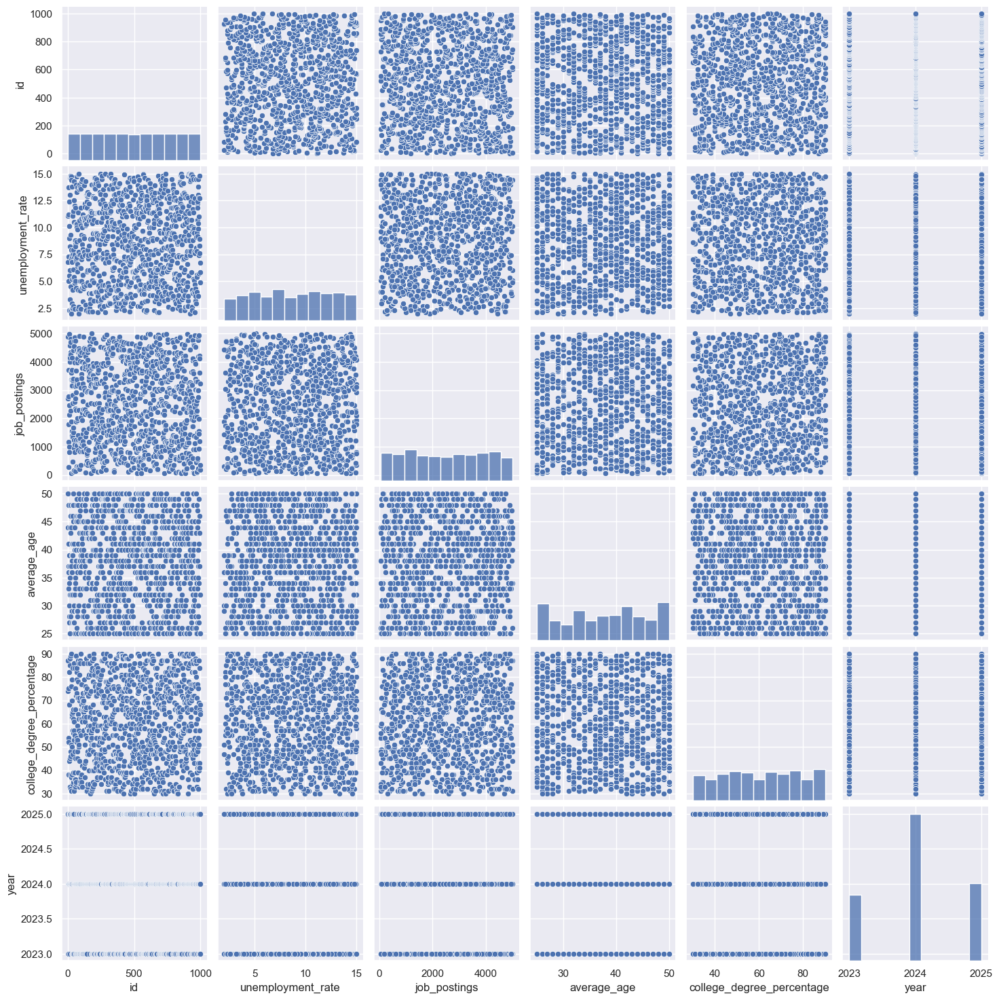

In [ ]:
import seaborn as sns

sns.pairplot(df.select_dtypes(include='number'))
plt.show()


6. Visualize the relationship between average_age and job_postings

<Axes: xlabel='average_age', ylabel='job_postings'>

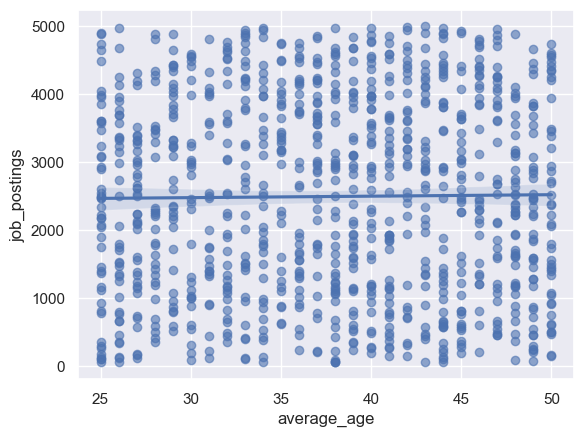

In [ ]:
sns.regplot(data= df,x = 'average_age',y = 'job_postings',scatter_kws ={'alpha':0.6})


<Axes: xlabel='college_degree_percentage', ylabel='unemployment_rate'>

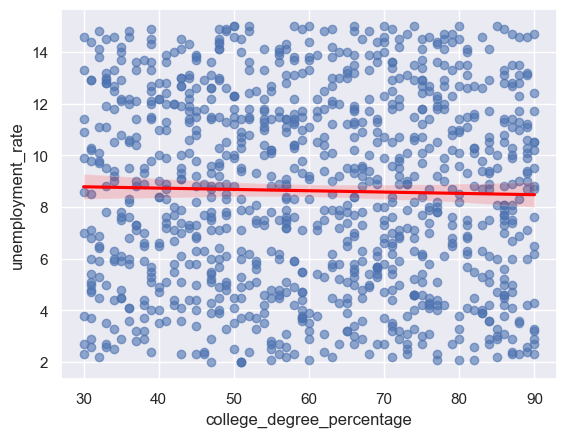

In [ ]:
sns.regplot(
    data=df,
    x='college_degree_percentage',
    y='unemployment_rate',
    scatter_kws={'alpha':0.6},
    line_kws={'color':'red'}    # Regression line color
)

8. Create a bubble chart with three numerical variables

<Axes: xlabel='college_degree_percentage', ylabel='unemployment_rate'>

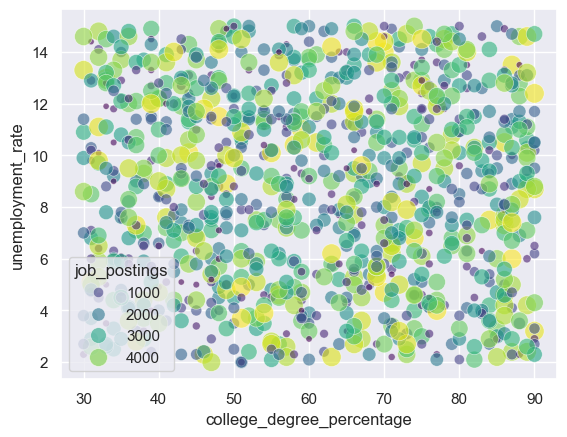

In [ ]:
sns.scatterplot(
    data=df,
    x='college_degree_percentage',
    y='unemployment_rate',
    size='job_postings',      
    hue='job_postings',     
    sizes=(20, 200),    
    alpha=0.6,
    palette='viridis'
)

9. Visualize job_postings vs unemployment_rate with marginal histograms

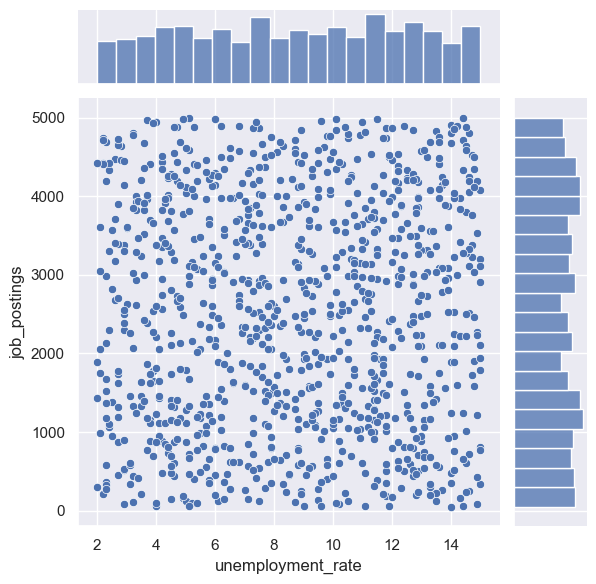

In [ ]:
sns.jointplot(
    data=df,
    x='unemployment_rate',
    y='job_postings',
    kind='scatter',      # Scatter in center
    marginal_kws={'bins':20, 'fill':True}  # Histograms on margins
)

10. ML Connection: Plot the residuals after fitting a linear regression between job_postings and unemployment_rate

<Axes: xlabel='job_postings', ylabel='unemployment_rate'>

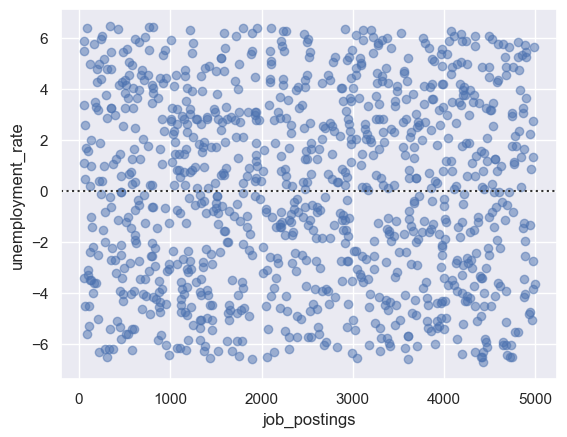

In [ ]:
sns.residplot(data = df,
            x = 'job_postings',
            y = 'unemployment_rate',
            scatter_kws={'alpha' : 0.5},
            line_kws={'color': 'red'})


Box Plots (10 questions)
1. Create a box plot of unemployment rates by city
2. Plot the distribution of job postings by year
3. Visualize college_degree_percentage distribution by unemployment category
4. Create a box plot of average_age by skill category (e.g., Python present/not present)
5. Plot the distribution of job_postings for high vs low unemployment cities
6. Visualize the spread of unemployment rates by month
7. Create a grouped box plot of job_postings by year and city
8. Plot the distribution of college_degree_percentage by top 5 cities
9. Visualize average_age distribution by year
10. Statistical Connection: Identify and label outliers in job_postings using box plot statistics

1.Create a box plot of unemployment rates by city

/var/folders/c3/wt5f_c9959z1k4kws7gcpgj00000gn/T/ipykernel_847/3103933991.py:3: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_unemploy,labels=df['location'].unique())


(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20]),
 [Text(1, 0, 'Houston'),
  Text(2, 0, 'Washington'),
  Text(3, 0, 'Chicago'),
  Text(4, 0, 'Indianapolis'),
  Text(5, 0, 'New York'),
  Text(6, 0, 'Los Angeles'),
  Text(7, 0, 'Phoenix'),
  Text(8, 0, 'San Jose'),
  Text(9, 0, 'Austin'),
  Text(10, 0, 'Dallas'),
  Text(11, 0, 'San Francisco'),
  Text(12, 0, 'Columbus'),
  Text(13, 0, 'San Antonio'),
  Text(14, 0, 'Jacksonville'),
  Text(15, 0, 'Seattle'),
  Text(16, 0, 'Charlotte'),
  Text(17, 0, 'Philadelphia'),
  Text(18, 0, 'Denver'),
  Text(19, 0, 'San Diego'),
  Text(20, 0, 'Fort Worth')])

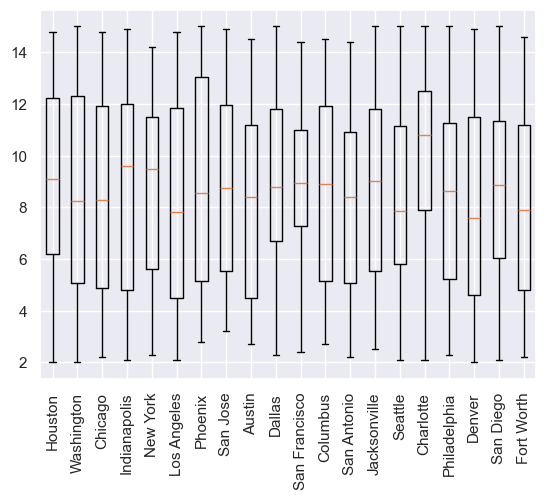

In [ ]:
data_unemploy = [group['unemployment_rate'].values for _, group in df.groupby('location')]

plt.boxplot(data_unemploy,labels=df['location'].unique())
plt.xticks(rotation=90)

2. Plot the distribution of job postings by year

/var/folders/c3/wt5f_c9959z1k4kws7gcpgj00000gn/T/ipykernel_847/1522176329.py:3: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(job_post,labels=sorted(df['year'].unique()))


{'whiskers': [<matplotlib.lines.Line2D at 0x2812ea8d0>,
 'caps': [<matplotlib.lines.Line2D at 0x2812eaea0>,
 'boxes': [<matplotlib.lines.Line2D at 0x2812ea7b0>,
 'medians': [<matplotlib.lines.Line2D at 0x2812eb4a0>,
 'fliers': [<matplotlib.lines.Line2D at 0x2812eb7a0>,
 'means': []}

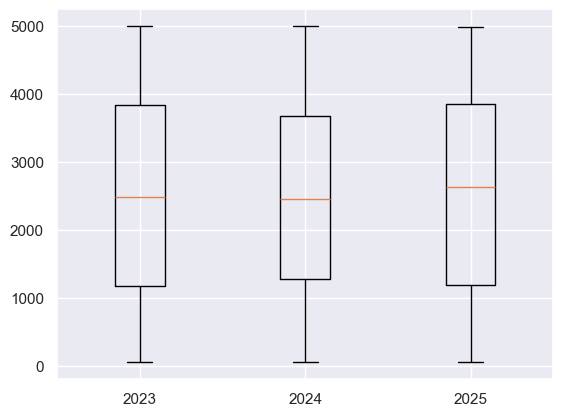

In [ ]:
df['year'] = df['date'].dt.year
job_post = [group['job_postings'].values for _,group in df.groupby('year')]
plt.boxplot(job_post,labels=sorted(df['year'].unique()))

3. Visualize college_degree_percentage distribution by unemployment category

/var/folders/c3/wt5f_c9959z1k4kws7gcpgj00000gn/T/ipykernel_847/1883596514.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  clz_data = [group['college_degree_percentage'] for _, group in df.groupby('unemployment_rat')]
/var/folders/c3/wt5f_c9959z1k4kws7gcpgj00000gn/T/ipykernel_847/1883596514.py:3: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(clz_data, labels =['Low','Medium','High'])


{'whiskers': [<matplotlib.lines.Line2D at 0x281ea6690>,
 'caps': [<matplotlib.lines.Line2D at 0x281ee04d0>,
 'boxes': [<matplotlib.lines.Line2D at 0x281d4f230>,
 'medians': [<matplotlib.lines.Line2D at 0x281ee2930>,
 'fliers': [<matplotlib.lines.Line2D at 0x281ee3aa0>,
 'means': []}

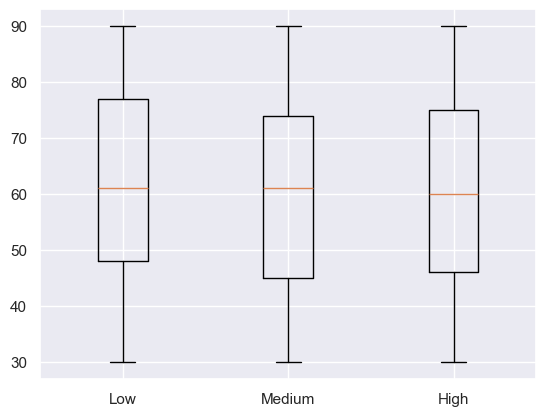

In [ ]:
df['unemployment_rat'] = pd.cut(df['unemployment_rate'], bins=[0, 4, 8, 15], labels=['Low', 'Medium', 'High'])
clz_data = [group['college_degree_percentage'] for _, group in df.groupby('unemployment_rat')]
plt.boxplot(clz_data, labels =['Low','Medium','High'])


4. Create a box plot of average_age by skill category (e.g., Python present/not present)

/var/folders/c3/wt5f_c9959z1k4kws7gcpgj00000gn/T/ipykernel_847/52841995.py:6: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(avg_age,labels = ['not_present','python_present'])


{'whiskers': [<matplotlib.lines.Line2D at 0x284dfd760>,
 'caps': [<matplotlib.lines.Line2D at 0x284dd8d40>,
 'boxes': [<matplotlib.lines.Line2D at 0x284dfdd60>,
 'medians': [<matplotlib.lines.Line2D at 0x284e45520>,
 'fliers': [<matplotlib.lines.Line2D at 0x284e46360>,
 'means': []}

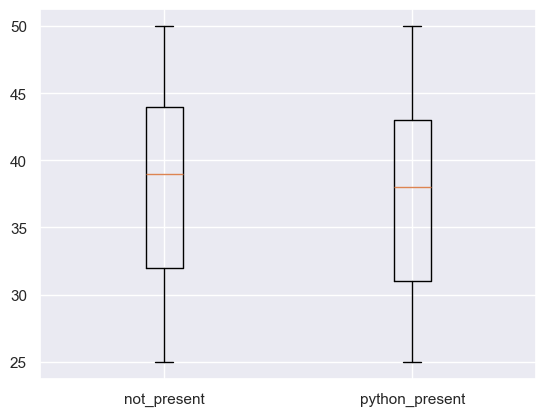

In [ ]:
df['skills'] = df['in_demand_skills'].str.contains('python', case=False, na=False).map(
    {True: 'python_present', False: 'not_present'}
)

avg_age = [group['average_age'] for _, group in df.groupby(df['skills'])]
plt.boxplot(avg_age,labels = ['not_present','python_present'])


5. Plot the distribution of job_postings for high vs low unemployment cities

/var/folders/c3/wt5f_c9959z1k4kws7gcpgj00000gn/T/ipykernel_858/2385241137.py:3: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_job_postings, labels = ['high', 'low'])


{'whiskers': [<matplotlib.lines.Line2D at 0x171dd2750>,
 'caps': [<matplotlib.lines.Line2D at 0x171f932c0>,
 'boxes': [<matplotlib.lines.Line2D at 0x171f92ba0>,
 'medians': [<matplotlib.lines.Line2D at 0x171f93890>,
 'fliers': [<matplotlib.lines.Line2D at 0x171f93b60>,
 'means': []}

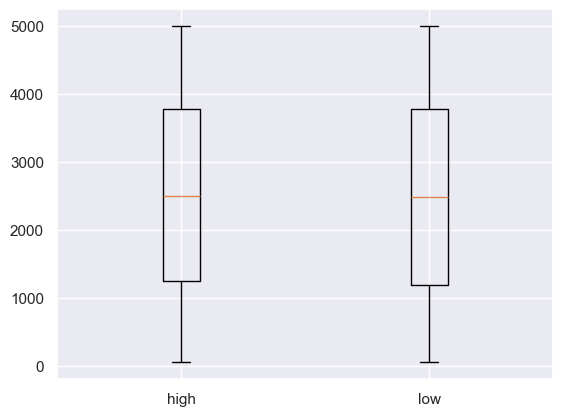

In [ ]:
df['data_cat'] = df['unemployment_rate'].apply(lambda x :'high' if x > 8 else 'low')
data_job_postings = [group['job_postings'] for _, group in df.groupby('data_cat')]
plt.boxplot(data_job_postings, labels = ['high', 'low'])

6. Visualize the spread of unemployment rates by month

/var/folders/c3/wt5f_c9959z1k4kws7gcpgj00000gn/T/ipykernel_858/1631090250.py:9: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_of_unemp, labels = labels)


(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]),
 [Text(1, 0, 'January'),
  Text(2, 0, 'February'),
  Text(3, 0, 'March'),
  Text(4, 0, 'April'),
  Text(5, 0, 'May'),
  Text(6, 0, 'June'),
  Text(7, 0, 'July'),
  Text(8, 0, 'August'),
  Text(9, 0, 'September'),
  Text(10, 0, 'October'),
  Text(11, 0, 'November'),
  Text(12, 0, 'December')])

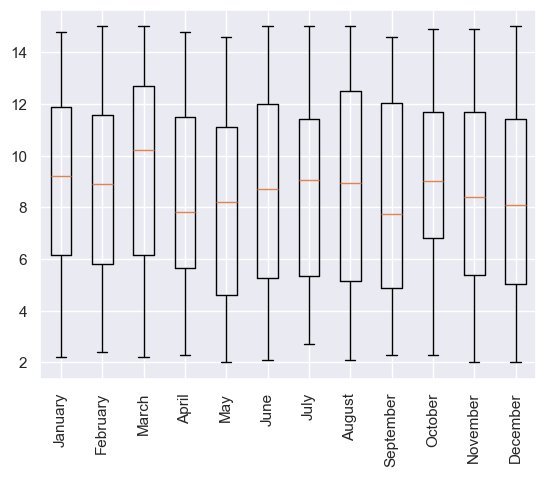

In [ ]:
df['month'] = df['date'].dt.month
data_of_unemp = [group['unemployment_rate'] for _, group in df.groupby(df['month'])]

month_names = ['January', 'February', 'March', 'April', 'May', 'June', 
               'July', 'August', 'September', 'October', 'November', 'December']

labels = [month_names[m-1] for m in sorted(df['month'].unique())]

plt.boxplot(data_of_unemp, labels = labels)
plt.xticks(rotation=90)

7. Create a grouped box plot of job_postings by year and city


/var/folders/c3/wt5f_c9959z1k4kws7gcpgj00000gn/T/ipykernel_858/3233217180.py:4: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(job_post,labels=sorted(df['year'].unique()))


{'whiskers': [<matplotlib.lines.Line2D at 0x1771c1a90>,
 'caps': [<matplotlib.lines.Line2D at 0x1771c2060>,
 'boxes': [<matplotlib.lines.Line2D at 0x1771c1850>,
 'medians': [<matplotlib.lines.Line2D at 0x1771c2570>,
 'fliers': [<matplotlib.lines.Line2D at 0x1771c2720>,
 'means': []}

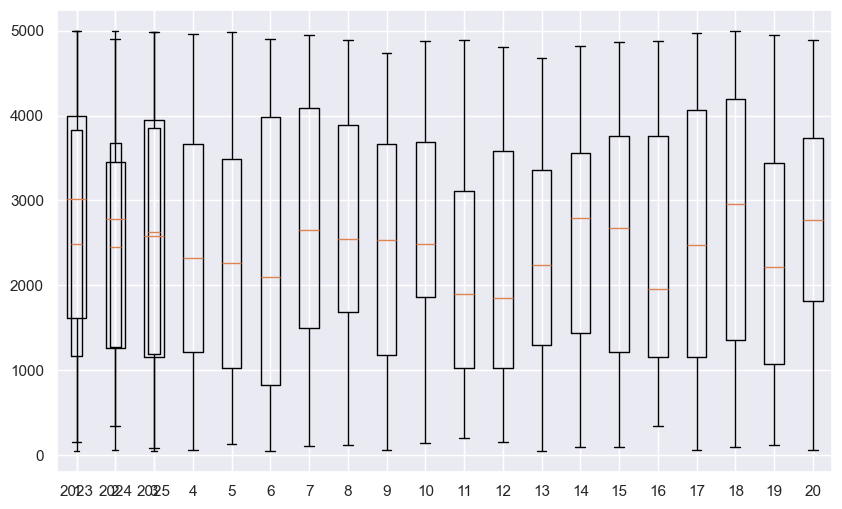

In [ ]:
plt.figure(figsize=(10,6))
df['year'] = df['date'].dt.year
job_post = [group['job_postings'].values for _,group in df.groupby('year')]
plt.boxplot(job_post,labels=sorted(df['year'].unique()))



city_data = [group['job_postings'] for _, group in df.groupby('location')]
plt.boxplot(city_data)


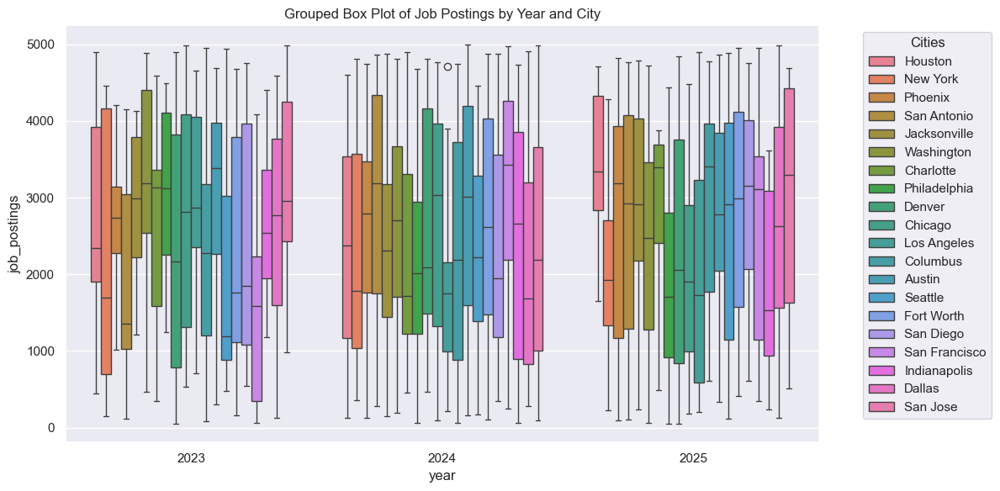

In [ ]:
plt.figure(figsize=(10, 6))

years = sorted(df['year'].unique())
cities = sorted(df['location'].unique())


sns.boxplot(data=df, x='year', y='job_postings', hue='location')
plt.title('Grouped Box Plot of Job Postings by Year and City')
plt.tight_layout()
plt.legend(title='Cities', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()



8. Plot the distribution of college_degree_percentage by top 5 cities

<Axes: xlabel='location', ylabel='college_degree_percentage'>

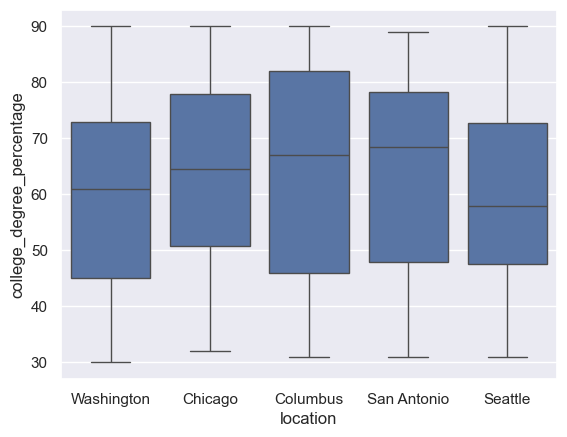

In [ ]:
top_five_cities = df.groupby('location')['college_degree_percentage'].sum().nlargest(5).index
top_five_cities_data = df[df['location'].isin(top_five_cities)]
sns.boxplot(data=top_five_cities_data, x='location', y='college_degree_percentage')


9. Visualize average_age distribution by year

<Axes: xlabel='year', ylabel='average_age'>

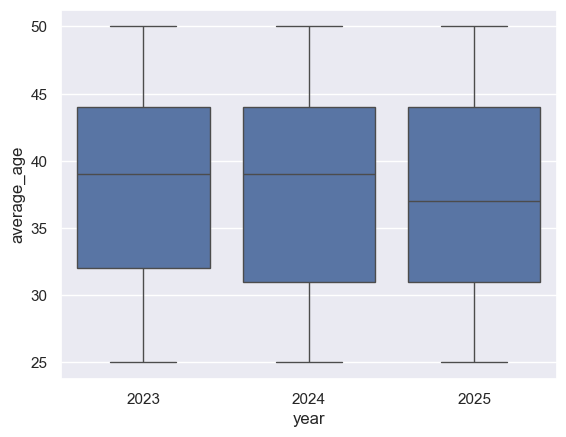

In [ ]:
sns.boxplot(data=df, x='year', y='average_age')

10. Statistical Connection: Identify and label outliers in job_postings using box plot statistics

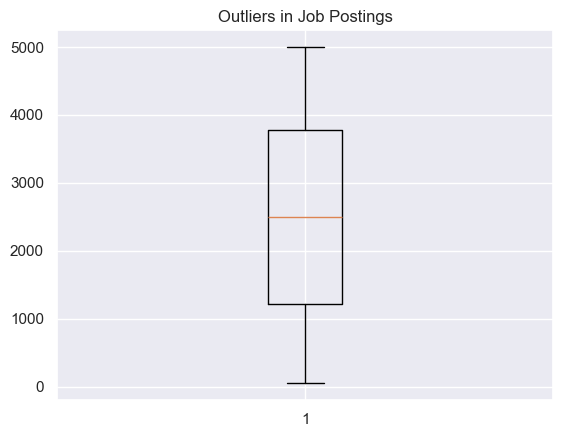

In [ ]:
# Calculate IQR
Q1 = df['job_postings'].quantile(0.25)
Q3 = df['job_postings'].quantile(0.75)
IQR = Q3 - Q1

# Outlier condition
lower = Q1 - 1.5 * IQR
upper = Q3 + 1.5 * IQR

# Filter outliers
outliers = df[(df['job_postings'] < lower) | (df['job_postings'] > upper)]

# Boxplot
plt.boxplot(df['job_postings'])
plt.title('Outliers in Job Postings')

for i in outliers['job_postings']:
    plt.text(1.05, i, str(i), fontsize=8)

plt.show()


Pie Charts (10 questions)
1. Create a pie chart of record distribution by year
2. Plot the proportion of job postings by top 5 cities
3. Visualize the skill frequency as a pie chart (top 5 skills)
4. Create a pie chart of unemployment rate categories
5. Plot the proportion of records before/after 2025
6. Visualize the distribution of college_degree_percentage categories
7. Create a pie chart of locations by region (group cities)
8. Plot the proportion of high-unemployment records by year
9. Visualize the distribution of in-demand skill categories
10. Statistical Connection: Create a pie chart showing the proportion of variance explained by PCA components (after preparing the data)

basic

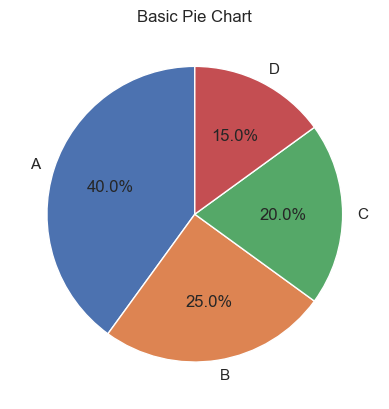

In [ ]:
values = [40, 25, 20, 15]
labels = ['A', 'B', 'C', 'D']


plt.pie(values, labels=labels, autopct='%1.1f%%', startangle=90
        )
plt.title("Basic Pie Chart")
plt.show()

1. Create a pie chart of record distribution by year

([<matplotlib.patches.Wedge at 0x17d25c0e0>,
 [Text(0.8296765185392286, 0.7222443316389718, '2023'),
  Text(-1.0917539039082917, 0.13443739547092007, '2024'),
  Text(0.7351871719295996, -0.8182296879423026, '2025')],
 [Text(0.45255082829412463, 0.39395145362125733, '22.8%'),
  Text(-0.5955021294045227, 0.07332948843868367, '50.5%'),
  Text(0.4010111846888725, -0.44630710251398314, '26.7%')])

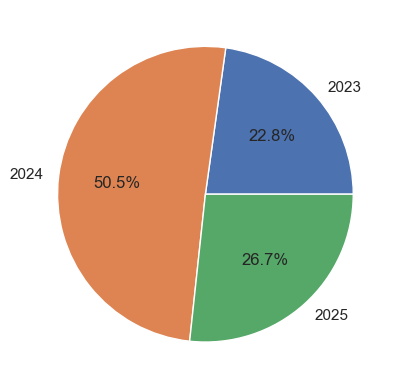

In [ ]:
year_data = df.groupby('year').size()
plt.pie(year_data, labels=year_data.index,autopct='%1.1f%%')

2. Plot the proportion of job postings by top 5 cities

([<matplotlib.patches.Wedge at 0x17d4aec00>,
 [Text(0.8642148519333804, 0.6805385291794767, 'Seattle'),
  Text(-0.4372970808236018, 1.0093419951152118, 'San Antonio'),
  Text(-1.0948472100341968, -0.10634654051888742, 'Dallas'),
  Text(-0.2694301619595775, -1.0664930322446726, 'Washington'),
  Text(0.9063153091315975, -0.6233719278518217, 'Chicago')],
 [Text(0.4713899192363893, 0.3712028340978963, '21.2%'),
  Text(-0.23852568044923733, 0.5505501791537518, '20.5%'),
  Text(-0.59718938729138, -0.05800720391939313, '19.5%'),
  Text(-0.14696190652340588, -0.5817234721334577, '19.5%'),
  Text(0.49435380498087134, -0.3400210515555391, '19.2%')])

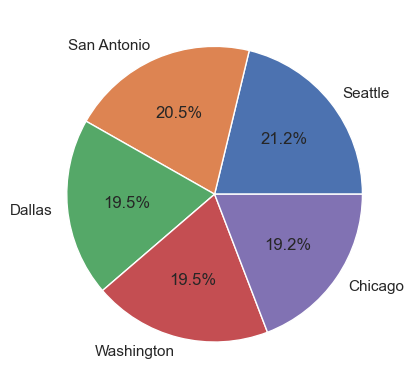

In [ ]:
five_top_cities = df.groupby('location')['job_postings'].size().nlargest(5)

plt.pie(five_top_cities,labels =five_top_cities.index,autopct = '%1.1f%%')

3. Visualize the skill frequency as a pie chart (top 5 skills)

([<matplotlib.patches.Wedge at 0x17d510e30>,
 [Text(0.8313245164615624, 0.7203468250294088, 'Customer Service, UX/UI Design'),
  Text(-0.5947049582740361, 0.9253788481504627, 'Python, UX/UI Design'),
  Text(-1.055442239322695, -0.30990592032662945, 'Agile Methodologies, Cybersecurity'),
  Text(-0.15654617382257752, -1.0888036073881788, 'Cloud Computing, Agile Methodologies'),
  Text(0.9253789873511787, -0.5947047416734687, 'Cybersecurity, Digital Marketing')],
 [Text(0.4534497362517612, 0.39291645001604114, '22.7%'),
  Text(-0.32438452269492873, 0.5047520989911615, '22.7%'),
  Text(-0.575695766903288, -0.16903959290543424, '18.2%'),
  Text(-0.08538882208504228, -0.5938928767571884, '18.2%'),
  Text(0.5047521749188247, -0.3243844045491647, '18.2%')])

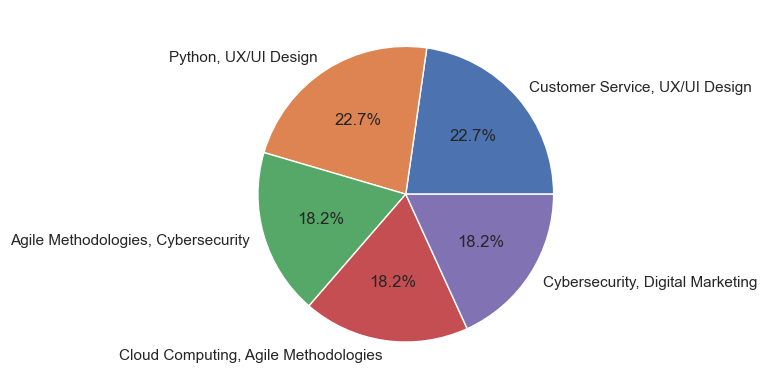

In [ ]:
skill_frequency = df.groupby('in_demand_skills').size().nlargest(5)

plt.pie(skill_frequency,labels=skill_frequency.index, autopct='%1.1f%%',startangle=0)

4. Create a pie chart of unemployment rate categories

/var/folders/c3/wt5f_c9959z1k4kws7gcpgj00000gn/T/ipykernel_858/3692889747.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  data_unemployment_rate = df.groupby('unemployment_category')['unemployment_rate'].size()


([<matplotlib.patches.Wedge at 0x288bfbaa0>,
 [Text(0.8409186736769637, 0.7091232504024787, 'low'),
  Text(-0.9432793379194951, 0.5658834603115372, 'medium'),
  Text(0.3563092223775124, -1.0406938733598525, 'high')],
 [Text(0.4586829129147074, 0.38679450021953377, '22.3%'),
  Text(-0.5145160025015427, 0.3086637056244748, '38.2%'),
  Text(0.19435048493318854, -0.5676512036508286, '39.5%')])

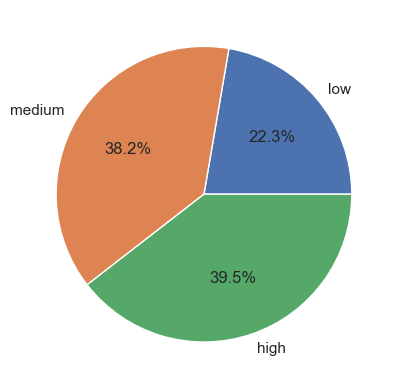

In [ ]:
df['unemployment_category'] = pd.cut(df['unemployment_rate'], bins=(0,5,10,15),labels=['low','medium','high'])
data_unemployment_rate = df.groupby('unemployment_category')['unemployment_rate'].size()

plt.pie(data_unemployment_rate, labels=data_unemployment_rate.index, autopct ='%1.1f%%',startangle = 0)

5. Plot the proportion of records before/after 2025

([<matplotlib.patches.Wedge at 0x143d041a0>,
 [Text(-1.1, 1.3471114790620887e-16, 'Before 2025'),
  Text(1.1, -2.6942229581241775e-16, 'After 2025')],
 [Text(-0.6, 7.347880794884119e-17, '100.0%'),
  Text(0.6, -1.4695761589768238e-16, '0.0%')])

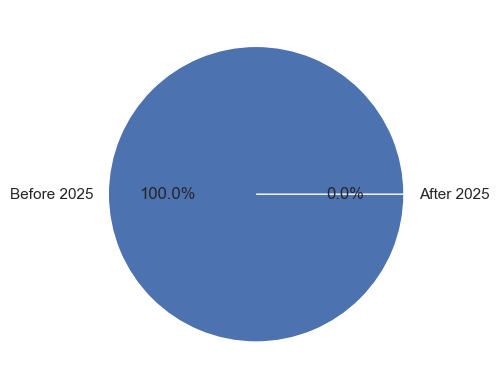

In [58]:
df['year'] = df['date'].dt.year

before_2025 =df[df['year'] < 2025].shape[0]
after_2025 = df[df['year'] > 2025].shape[0]

bef_and_after_2025 = pd.Series(
    [before_2025, after_2025],
    index=['Before 2025', 'After 2025']
)


plt.pie(bef_and_after_2025,
        labels= bef_and_after_2025.index,
        autopct='%1.1f%%',
        startangle=0)

6. Visualize the distribution of college_degree_percentage categories

/var/folders/c3/wt5f_c9959z1k4kws7gcpgj00000gn/T/ipykernel_858/508387309.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  college_data_pie = df.groupby('college_category')['college_degree_percentage'].size()


([<matplotlib.patches.Wedge at 0x14558eb10>,
 [Text(1.1, 0.0, 'E'),
  Text(0.9605886994880064, 0.5359751397368544, 'D'),
  Text(-0.5480036415915862, 0.953777756504292, 'C'),
  Text(-0.5359750498000472, -0.9605887496696165, 'B'),
  Text(0.9537778334659881, -0.5480035076429037, 'A')],
 [Text(0.6, 0.0, '0.0%'),
  Text(0.5239574724480035, 0.2923500762201024, '16.2%'),
  Text(-0.2989110772317743, 0.5202424126387046, '34.2%'),
  Text(-0.2923500271636621, -0.5239574998197908, '33.0%'),
  Text(0.5202424546178116, -0.2989110041688566, '16.6%')])

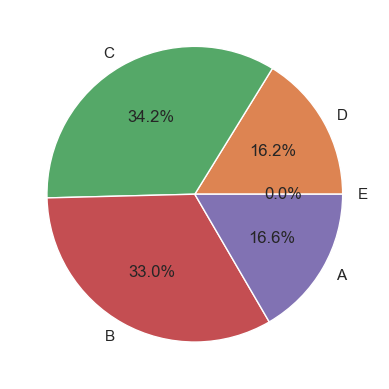

In [64]:
df['college_category'] = pd.cut(df['college_degree_percentage'], bins = [0,20,40,60,80,100], labels=['E','D','C','B','A'])

college_data_pie = df.groupby('college_category')['college_degree_percentage'].size()
plt.pie(college_data_pie,labels=college_data_pie.index ,autopct='%1.1f%%')

7. Create a pie chart of locations by region (group cities)


([<matplotlib.patches.Wedge at 0x1456a6b10>,
 [Text(1.0864571742518743, 0.1720779140872905, 'Austin'),
  Text(0.9832255636109513, 0.4932215435906337, 'Charlotte'),
  Text(0.772914956812565, 0.7826892547719249, 'Chicago'),
  Text(0.46522804064862133, 0.9967762387789171, 'Columbus'),
  Text(0.10007820860189433, 1.0954379727593142, 'Dallas'),
  Text(-0.2601489135374877, 1.0687949021141825, 'Denver'),
  Text(-0.5717990950949605, 0.9397051637873363, 'Fort Worth'),
  Text(-0.8065808942201664, 0.7479487021708086, 'Houston'),
  Text(-0.9721422032178462, 0.5147227765727412, 'Indianapolis'),
  Text(-1.077145098575975, 0.2230659916117952, 'Jacksonville'),
  Text(-1.0978293989430645, -0.069069608485279, 'Los Angeles'),
  Text(-1.0418081248508946, -0.35303800219617004, 'New York'),
  Text(-0.8979731562781879, -0.6353300013408696, 'Philadelphia'),
  Text(-0.6714638332860126, -0.8712842937806548, 'Phoenix'),
  Text(-0.3464851531466764, -1.0440057656205373, 'San Antonio'),
  Text(0.01036712328536987, 

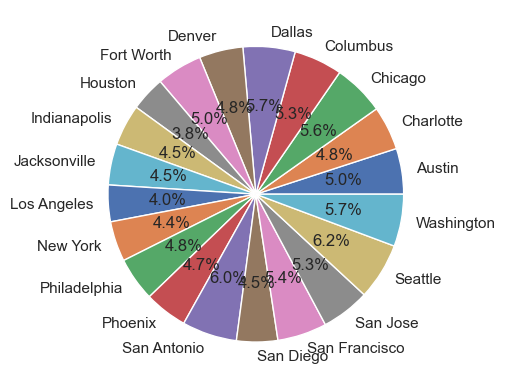

In [65]:
region_data = df.groupby('location').size()
plt.pie(region_data,labels = region_data.index, autopct='%1.1f%%')

8. Plot the proportion of high-unemployment records by year

([<matplotlib.patches.Wedge at 0x145826b10>,
 [Text(0.8635100019508276, 0.68143266470788, '2023'),
  Text(-1.0846927648167122, 0.18287046222470354, '2024'),
  Text(0.7382083900738046, -0.8155049802574119, '2025')],
 [Text(0.47100545560954227, 0.3716905443861163, '21.3%'),
  Text(-0.5916505989909339, 0.09974752484983829, '52.2%'),
  Text(0.40265912185843883, -0.44482089832222466, '26.6%')])

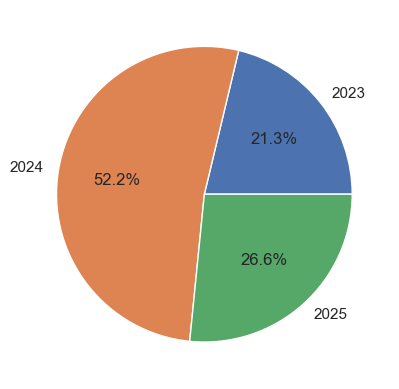

In [68]:
high_unemp = df[df['unemployment_rate'] > 10]

unemp_records_year = high_unemp.groupby(df['year'])['unemployment_rate'].size()

plt.pie(unemp_records_year,
        labels = unemp_records_year.index,
        autopct='%1.1f%%',
        startangle=0)

9. Visualize the distribution of in-demand skill categories

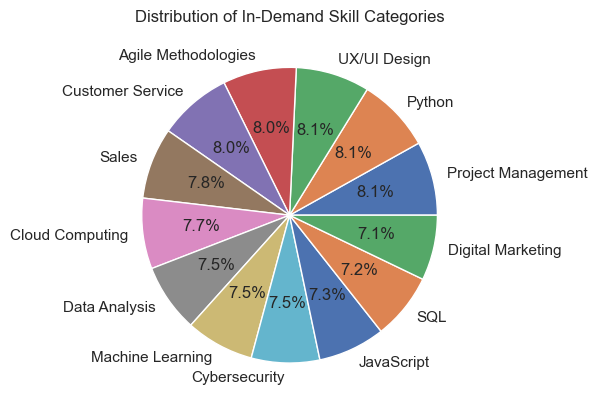

In [72]:

skills = df['in_demand_skills'].str.split(',').explode().str.strip()
skill_counts = skills.value_counts()


plt.pie(
    skill_counts,
    labels=skill_counts.index,
    autopct='%1.1f%%',
    startangle=0
)
plt.title('Distribution of In-Demand Skill Categories')
plt.show()


([<matplotlib.patches.Wedge at 0x1471a0890>,
 [Text(1.0645733360281726, 0.2769180604761051, 'Project Management'),
  Text(0.7947044802349661, 0.7605555792277593, 'Python'),
  Text(0.32432037619716797, 1.05110241821781, 'UX/UI Design'),
  Text(-0.22606690995077208, 1.0765192762906337, 'Agile Methodologies'),
  Text(-0.7182452053422982, 0.833140939459105, 'Customer Service'),
  Text(-1.028705955206073, 0.3895690666923659, 'Sales'),
  Text(-1.0912320292171045, -0.1386097341845822, 'Cloud Computing'),
  Text(-0.9054114485573164, -0.6246840071759019, 'Data Analysis'),
  Text(-0.5247735968522282, -0.9667536770278017, 'Machine Learning'),
  Text(-0.030551825185336206, -1.0995756390434652, 'Cybersecurity'),
  Text(0.4658227758656254, -0.996498440282193, 'JavaScript'),
  Text(0.8583439783332719, -0.6879284954550233, 'SQL'),
  Text(1.0725146114806183, -0.2443612247484826, 'Digital Marketing')],
 [Text(0.5806763651062758, 0.1510462148051482, '8.1%'),
  Text(0.4334751710372542, 0.4148484977605959,

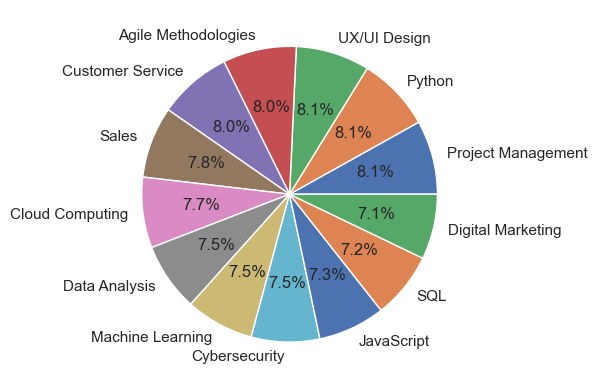

In [77]:
skills = df['in_demand_skills'].str.split(',').explode().str.strip()
skills_count = skills.value_counts()

plt.pie(skills_count,labels = skills_count.index,autopct='%1.1f%%')

10. Statistical Connection: Create a pie chart showing the proportion of variance explained by PCA components (after preparing the data)

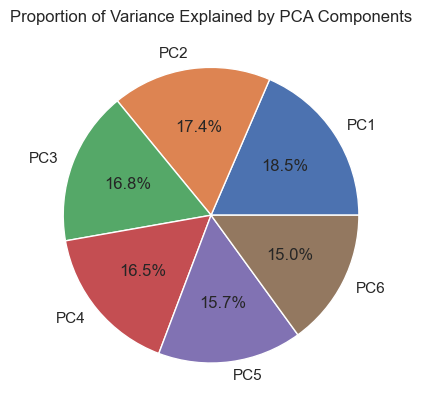

In [78]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# 1. Select numeric features (if not already selected)
numeric_data = df.select_dtypes(include=['number'])

# 2. Standardize the data (important for PCA)
scaled_data = StandardScaler().fit_transform(numeric_data)

# 3. Apply PCA
pca = PCA()
pca.fit(scaled_data)

# 4. Get variance ratio
variance_ratio = pca.explained_variance_ratio_

# 5. Plot pie chart
plt.pie(
    variance_ratio,
    labels=[f'PC{i+1}' for i in range(len(variance_ratio))],
    autopct='%1.1f%%',
    startangle=0
)
plt.title('Proportion of Variance Explained by PCA Components')
plt.show()


Heatmaps (10 questions)
1. Create a heatmap of correlation between numerical variables
2. Plot a monthly heatmap of average unemployment rates
3. Visualize skill co-occurrence as a heatmap
4. Create a heatmap of average job postings by city and month
5. Plot a daily heatmap of job posting activity
6. Visualize the covariance matrix of numerical features
7. Create a heatmap of unemployment rates by city and year
8. Plot a confusion matrix for a classification model (after building one)
9. Visualize missing data patterns as a heatmap
10. ML Connection: Create a heatmap of feature importance from a trained model

1. Create a heatmap of correlation between numerical variables

<Axes: >

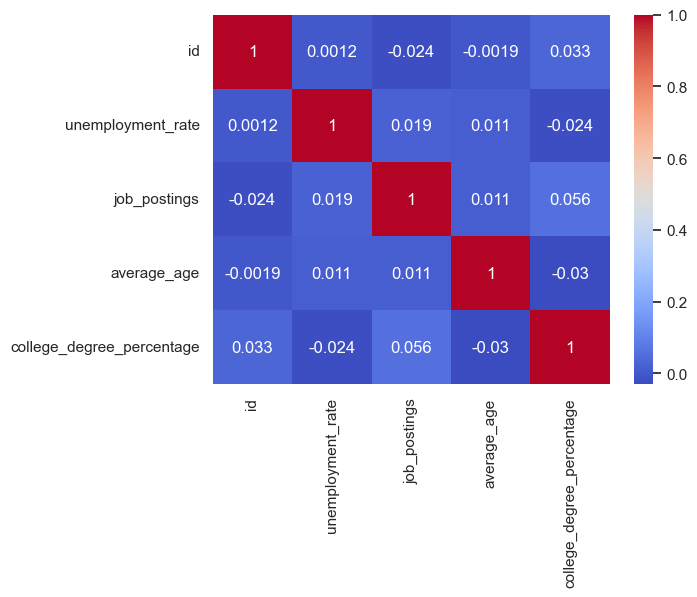

In [4]:
corr_matrix = df.corr(numeric_only=True)
sns.heatmap(corr_matrix, annot = True, cmap = 'coolwarm')

2. Plot a monthly heatmap of average unemployment rates

<Axes: xlabel='month'>

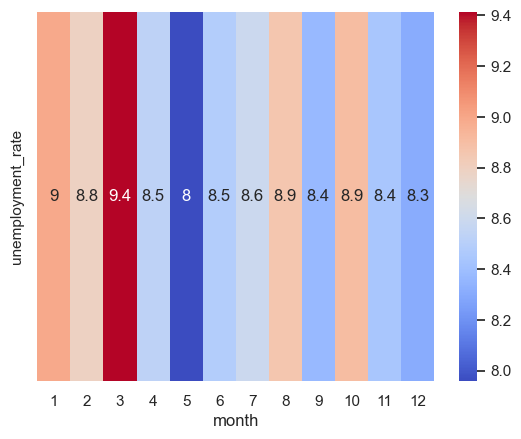

In [14]:
df['month'] = df['date'].dt.month
unemp_monthly = df.groupby(df['month'])['unemployment_rate'].mean()
# 3. Reshape into a 2D structure (DataFrame) for heatmap
unemp_monthly_df = pd.DataFrame(unemp_monthly).T

sns.heatmap(unemp_monthly_df,
            annot=True,
            cmap='coolwarm')

3. Visualize skill co-occurrence as a heatmap

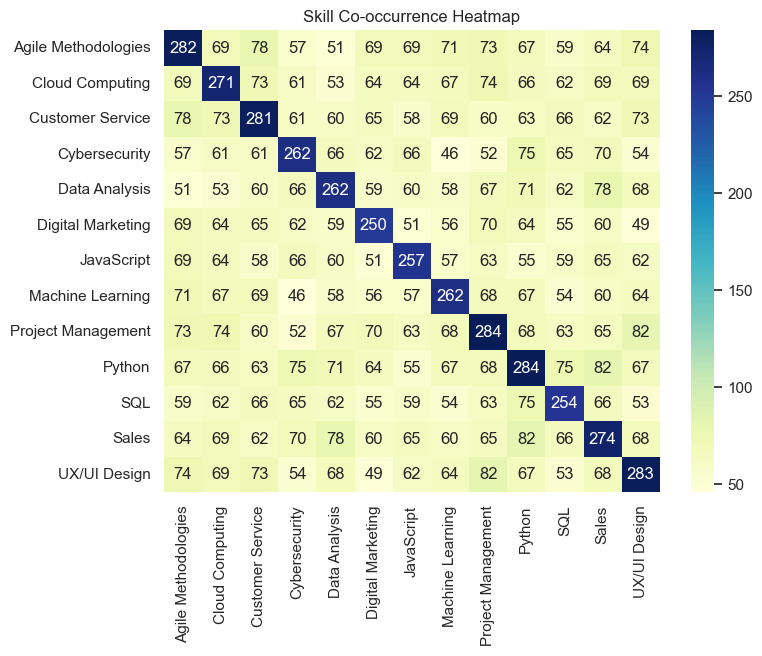

In [15]:
# 1. Split skills into lists
df['in_demand_skills'] = df['in_demand_skills'].str.split(', ')

# 2. Create a list of all unique skills
all_skills = sorted(set(skill for sublist in df['in_demand_skills'] for skill in sublist))

# 3. Create a co-occurrence matrix
co_matrix = pd.DataFrame(0, index=all_skills, columns=all_skills)

# 4. Count co-occurrences
for skills in df['in_demand_skills']:
    for skill1 in skills:
        for skill2 in skills:
            co_matrix.loc[skill1, skill2] += 1

# 5. Plot the heatmap
plt.figure(figsize=(8,6))
sns.heatmap(co_matrix, annot=True, cmap="YlGnBu", fmt="d")
plt.title("Skill Co-occurrence Heatmap")
plt.show()


4. Create a heatmap of average job postings by city and month

<Axes: xlabel='month', ylabel='location'>

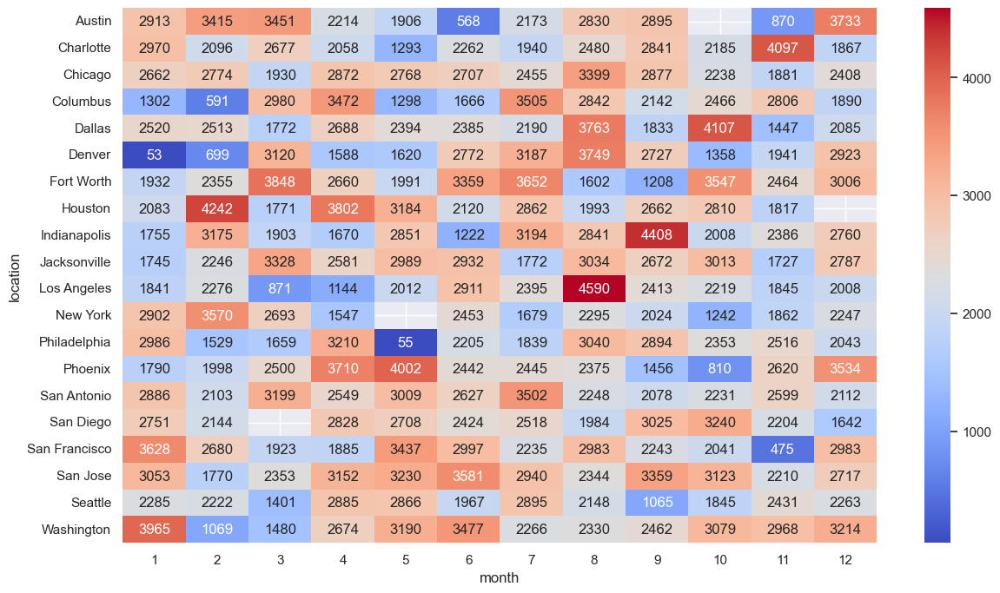

In [21]:
plt.figure(figsize=(14,8))
avg_job = df.groupby(['location',df['month']])['job_postings'].mean()
avg_job_df = avg_job.unstack(level='month')

sns.heatmap(avg_job_df, annot =True, cmap = 'coolwarm',fmt='.0f')

5. Plot a daily heatmap of job posting activity

<Axes: xlabel='day'>

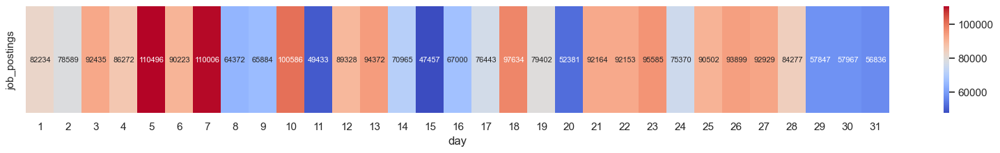

In [42]:
plt.figure(figsize=(20,2))
df['day'] = df['date'].dt.day
daily_data = df.groupby(df['day'])['job_postings'].sum()
daily_data_df = pd.DataFrame(daily_data).T
sns.heatmap(daily_data_df,
            annot=True,
            cmap='coolwarm',
            fmt = '.0f',
            annot_kws = {'size':8})

6. Visualize the covariance matrix of numerical features

<Axes: >

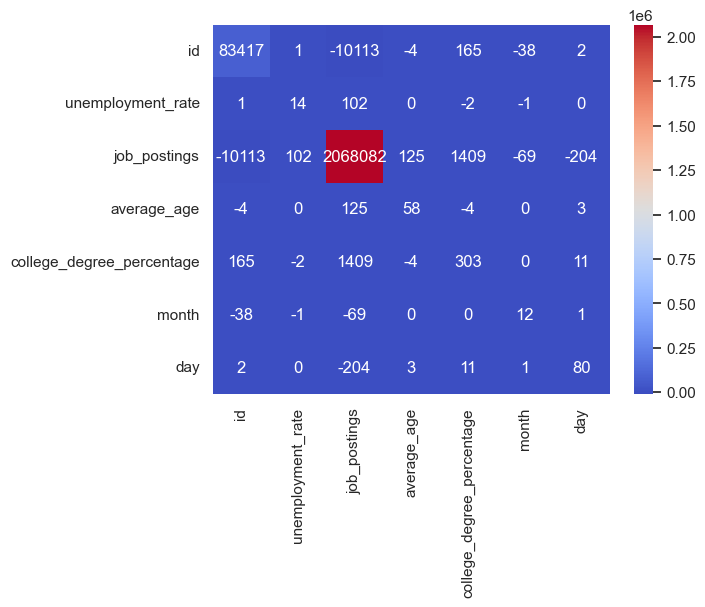

In [44]:
numeric_data = df.select_dtypes(include='number')
cov_matrix= numeric_data.cov()

sns.heatmap(cov_matrix,
            annot = True,
            cmap='coolwarm',
            fmt = '.0f')


7. Create a heatmap of unemployment rates by city and year

<Axes: xlabel='location', ylabel='year'>

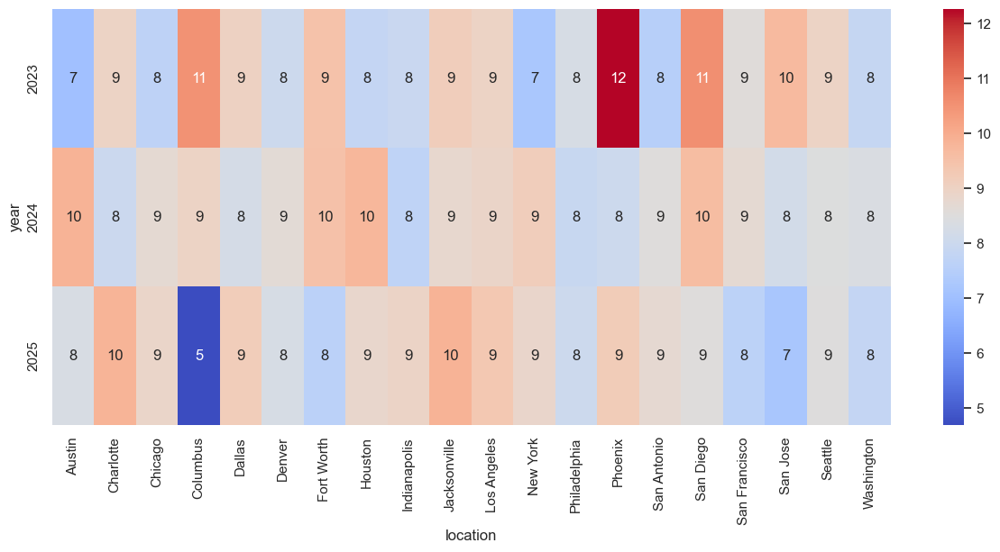

In [61]:
df['year'] = df['date'].dt.year
plt.figure(figsize=(15,6))
rate_of_unemp = df.groupby(['year','location'])['unemployment_rate'].mean()
df_rate_of_unemp = rate_of_unemp.unstack(level='location')
sns.heatmap(df_rate_of_unemp,
            annot = True,
            cmap= 'coolwarm',
            fmt ='.0f')

8. Plot a confusion matrix for a classification model (after building one)

9. Visualize missing data patterns as a heatmap

id                           0
date                         0
location                     0
unemployment_rate            0
job_postings                 0
in_demand_skills             0
average_age                  0
college_degree_percentage    0
month                        0
day                          0
year                         0
dtype: int64


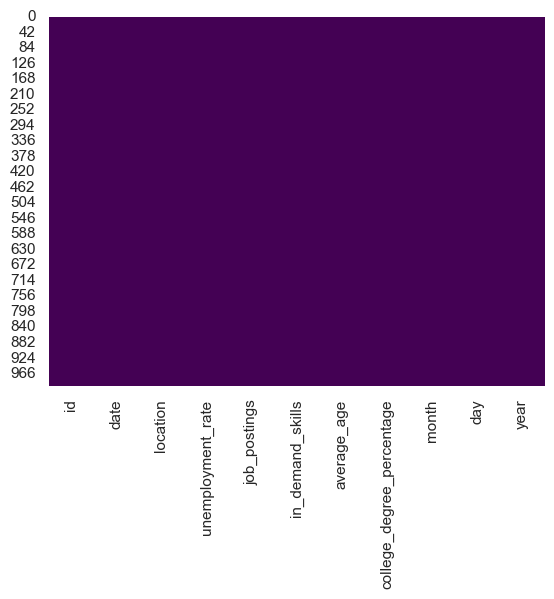

In [70]:
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
# Check count of missing values per column
print(df.isnull().sum())


10. ML Connection: Create a heatmap of feature importance from a trained model

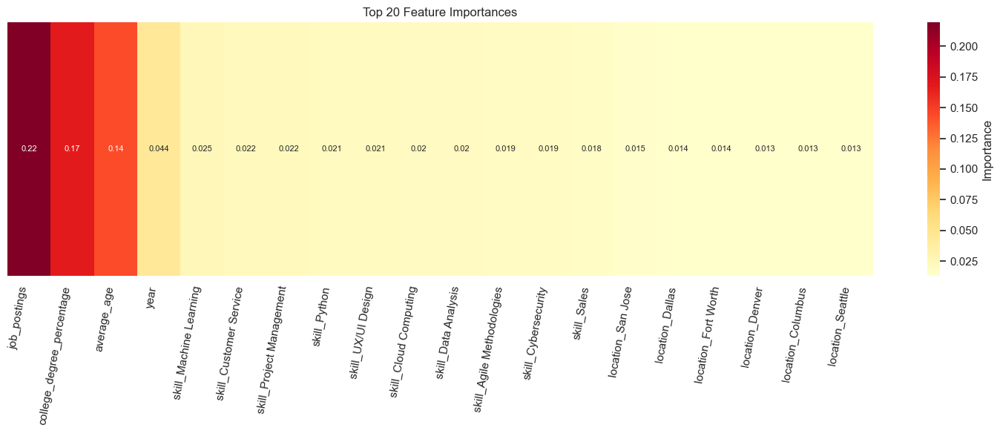

In [78]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# Load data
data = pd.read_csv('job_trends.csv')

# Preprocess: create binary columns for top 10 skills
data['date'] = pd.to_datetime(data['date'])
data['year'] = data['date'].dt.year

skills = data['in_demand_skills'].str.split(', ').explode()
top_skills = skills.value_counts().head(10).index.tolist()
for skill in top_skills:
    data[f'skill_{skill}'] = data['in_demand_skills'].str.contains(skill).astype(int)

# Prepare features and target
features = ['job_postings', 'average_age', 'college_degree_percentage', 'year', 'location'] + [f'skill_{s}' for s in top_skills]
X = data[features]
y = data['unemployment_rate']

# One-hot encode location simply with pandas
X = pd.get_dummies(X, columns=['location'], drop_first=True)

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=0.2)

# Train model
model = RandomForestRegressor(random_state=42)
model.fit(X_train, y_train)

# Get feature importance
importance = model.feature_importances_

# Create DataFrame for plotting
imp_df = pd.DataFrame({'Feature': X.columns, 'Importance': importance}).sort_values(by='Importance', ascending=False).head(20)

# Plot heatmap (1-row)
plt.figure(figsize=(15, 6))
sns.heatmap([imp_df['Importance']], annot=True, xticklabels=imp_df['Feature'],
             cmap='YlOrRd', cbar_kws={'label': 'Importance'},annot_kws={'size':8})
plt.xticks(rotation=80, ha='right')
plt.yticks([])
plt.title('Top 20 Feature Importances')
plt.tight_layout()
plt.show()


Advanced Visualization Challenges (10 questions)
1. Create a small multiples plot showing unemployment trends for 4 cities
2. Plot a radar chart comparing skill frequencies across cities
3. Visualize the data as a streamgraph of skill popularity over time
4. Create a bubble plot animated over time
5. Plot a Sankey diagram of skill transitions between years
6. Visualize the data as a hexagonal binning plot of two key variables
7. Create a violin-boxplot hybrid visualization
8. Plot a ternary diagram if you can identify three appropriate dimensions
9. Visualize the data as a network graph of skill connections
10. ML Connection: Create a partial dependence plot from a trained model showing relationships between features and predictions

1.Create a small multiples plot showing unemployment trends for 4 cities

Text(0.5, 1.02, 'unemployment of four cities')

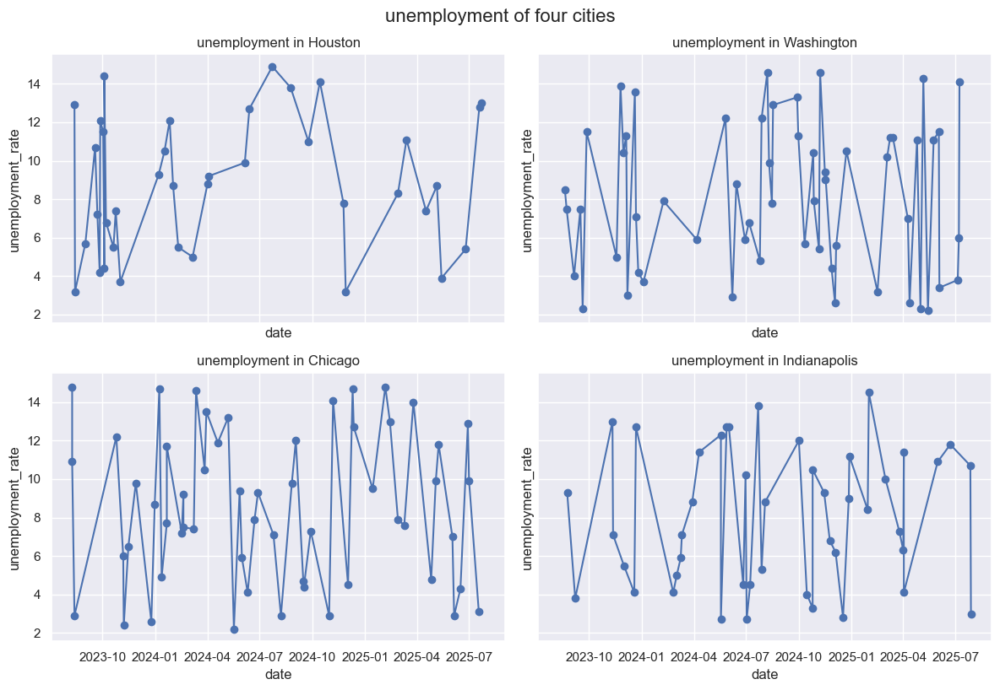

In [15]:
cities = df['location'].unique()[:4]
filtered_df = df[df['location'].isin(cities)].sort_values(by=['location','date'])

fig, axs = plt.subplots(nrows = 2,ncols = 2, figsize=(12,8),sharex=True, sharey=True)
axs = axs.flatten()

for i, city in enumerate(cities):
    city_data = filtered_df[filtered_df['location'] == city]
    axs[i].plot(city_data['date'],city_data['unemployment_rate'],marker = 'o')
    axs[i].set_title(f'unemployment in {city}')
    axs[i].set_xlabel('date')
    axs[i].set_ylabel('unemployment_rate')

plt.tight_layout()
plt.suptitle('unemployment of four cities', fontsize = 16, y = 1.02)

2. Plot a radar chart comparing skill frequencies across cities

<>:9: SyntaxWarning: invalid escape sequence '\s'
<>:19: SyntaxWarning: invalid escape sequence '\s'
<>:9: SyntaxWarning: invalid escape sequence '\s'
<>:19: SyntaxWarning: invalid escape sequence '\s'
/var/folders/c3/wt5f_c9959z1k4kws7gcpgj00000gn/T/ipykernel_764/1127595908.py:9: SyntaxWarning: invalid escape sequence '\s'
  all_skills = df['in_demand_skills'].str.split(',\s*').explode()
/var/folders/c3/wt5f_c9959z1k4kws7gcpgj00000gn/T/ipykernel_764/1127595908.py:19: SyntaxWarning: invalid escape sequence '\s'
  city_skills = df[df['location'] == city]['in_demand_skills'].str.split(',\s*').explode()


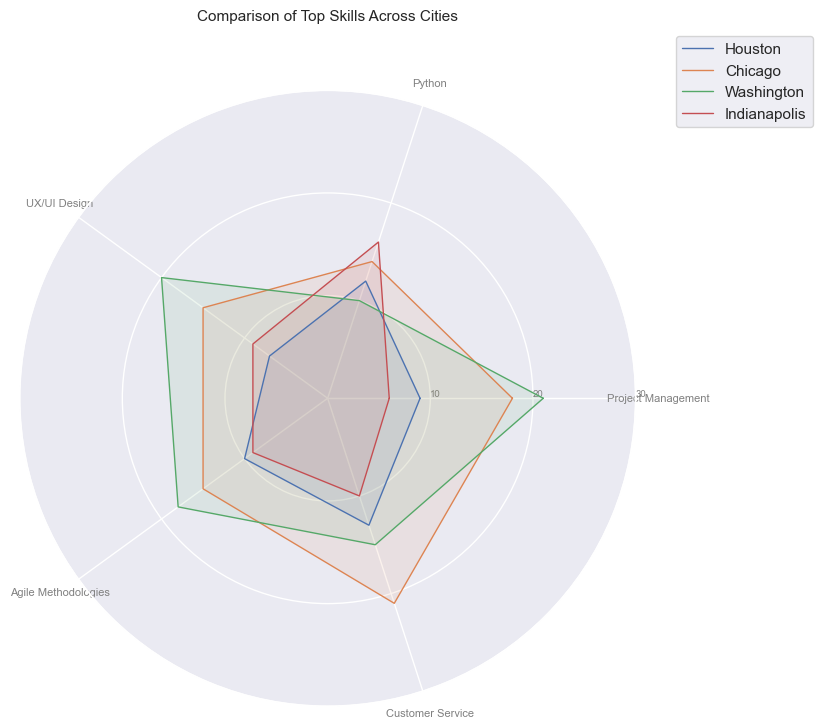

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
from math import pi

# Load the data
df = pd.read_csv('job_trends.csv')

# Extract and clean skills (convert to list and flatten)
all_skills = df['in_demand_skills'].str.split(',\s*').explode()

# Get top N skills to compare (adjust as needed)
top_skills = all_skills.value_counts().head(5).index.tolist()

# Count skills by city
cities = ['Houston', 'Chicago', 'Washington', 'Indianapolis']  # Example cities
skill_data = {}

for city in cities:
    city_skills = df[df['location'] == city]['in_demand_skills'].str.split(',\s*').explode()
    skill_counts = city_skills.value_counts()
    skill_data[city] = [skill_counts.get(skill, 0) for skill in top_skills]

# Prepare radar chart
categories = top_skills
N = len(categories)

angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]  # Close the loop

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, polar=True)

# Draw one axis per variable
plt.xticks(angles[:-1], categories, color='grey', size=8)

# Draw ylabels
ax.set_rlabel_position(0)
plt.yticks([10, 20, 30], ["10", "20", "30"], color="grey", size=7)
plt.ylim(0, 30)

# Plot each city
for city, values in skill_data.items():
    values += values[:1]  # Close the loop
    ax.plot(angles, values, linewidth=1, linestyle='solid', label=city)
    ax.fill(angles, values, alpha=0.1)

plt.title('Comparison of Top Skills Across Cities', size=11, y=1.1)
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
plt.show()

3. Visualize the data as a streamgraph of skill popularity over time


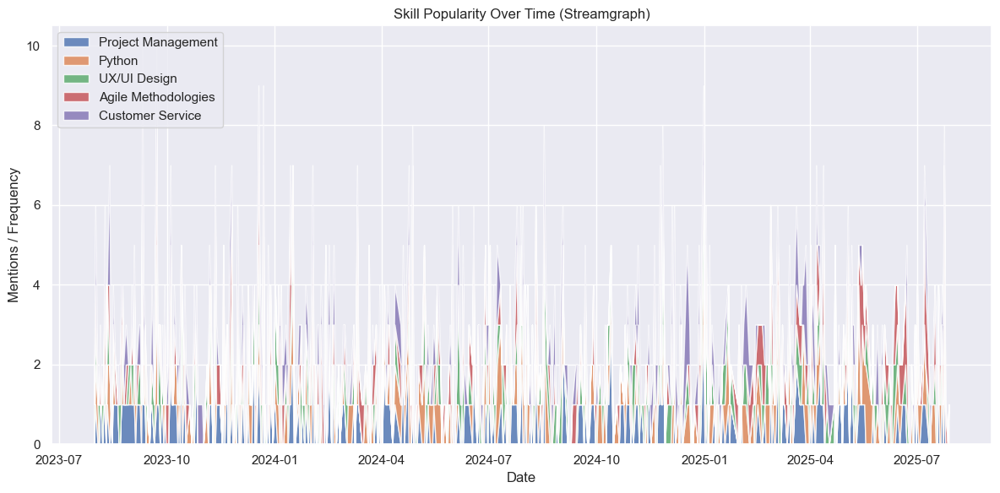

In [19]:
import pandas as pd
import matplotlib.pyplot as plt

# Step 1: Preprocess skills (split comma-separated lists)
df_expanded = df.copy()
df_expanded['in_demand_skills'] = df['in_demand_skills'].str.split(', ')
df_expanded = df_expanded.explode('in_demand_skills')

# Step 2: Convert date column to datetime
df_expanded['date'] = pd.to_datetime(df_expanded['date'])

# Step 3: Group by date and skill to get counts
skill_trend = df_expanded.groupby(['date', 'in_demand_skills']).size().unstack(fill_value=0)

# (Optional) Pick top N skills for readability
top_skills = skill_trend.sum().sort_values(ascending=False).head(5).index
skill_trend = skill_trend[top_skills]

# Step 4: Plot streamgraph (stacked area chart)
plt.figure(figsize=(12, 6))
plt.stackplot(skill_trend.index, skill_trend.T, labels=skill_trend.columns, alpha=0.8)

plt.title("Skill Popularity Over Time (Streamgraph)")
plt.xlabel("Date")
plt.ylabel("Mentions / Frequency")
plt.legend(loc='upper left')
plt.tight_layout()
plt.show()


4. Create a bubble plot animated over time

In [ ]:


# STEP 1: Clean and explode multi-skill rows
df['in_demand_skills'] = df['in_demand_skills'].str.split(', ')
df_exploded = df.explode('in_demand_skills')

# STEP 2: Ensure date is datetime or string
df_exploded['date'] = pd.to_datetime(df_exploded['date']).dt.strftime('%Y-%m')

# Optional: Remove missing or invalid data
df_exploded = df_exploded.dropna(subset=[
    'unemployment_rate', 'college_degree_percentage', 'job_postings'
])

# STEP 3: Plot animated bubble chart
fig = px.scatter(
    df_exploded,
    x='unemployment_rate',
    y='college_degree_percentage',
    size='job_postings',
    color='in_demand_skills',
    animation_frame='date',
    animation_group='in_demand_skills',
    size_max=50,
    hover_name='location',
    title='Animated Bubble Plot: Skill Trends Over Time',
    labels={
        'unemployment_rate': 'Unemployment Rate',
        'college_degree_percentage': 'College Degree (%)',
        'job_postings': 'Job Postings'
    }
)

fig.update_layout(legend_title_text='Skill')
fig.show()


5. Plot a Sankey diagram of skill transitions between years

In [24]:

# Extract year and clean skills
df['year'] = pd.to_datetime(df['date']).dt.year
df['in_demand_skills'] = df['in_demand_skills'].fillna('').str.lower()

# Create a mapping of year → set of skills
year_skills = {}
for year in sorted(df['year'].unique()):
    skills = df[df['year'] == year]['in_demand_skills'].str.split(',').explode().str.strip()
    year_skills[year] = set(skills.dropna())

# Create transitions between years
links = []
for i in range(len(year_skills) - 1):
    y1, y2 = sorted(year_skills)[i], sorted(year_skills)[i + 1]
    for skill in year_skills[y1].intersection(year_skills[y2]):
        links.append((f"{skill} {y1}", f"{skill} {y2}", 1))

# Prepare Sankey data
nodes = list(set([s for s, t, _ in links] + [t for s, t, _ in links]))
node_ids = {name: i for i, name in enumerate(nodes)}

source = [node_ids[s] for s, t, v in links]
target = [node_ids[t] for s, t, v in links]
value = [v for s, t, v in links]

# Plot the Sankey diagram
fig = go.Figure(go.Sankey(    node=dict(label=nodes, pad=15, thickness=20),
    link=dict(source=source, target=target, value=value)
))
fig.update_layout(title_text="Skill Transitions Between Years", font_size=10)
fig.show()


6. Visualize the data as a hexagonal binning plot of two key variables

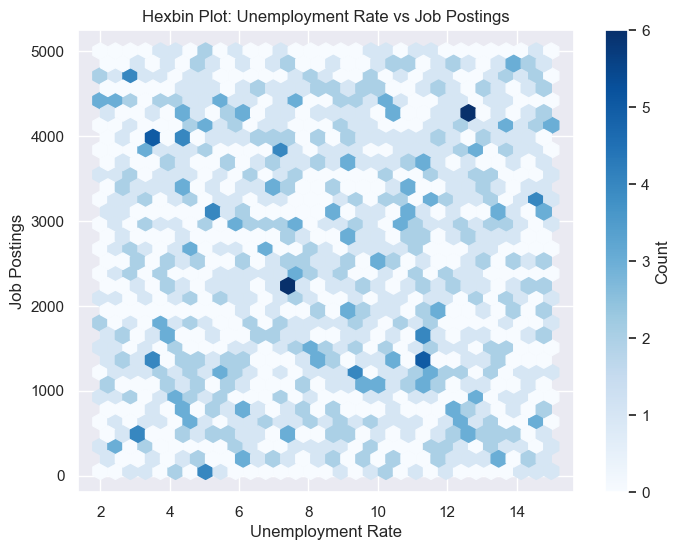

In [25]:


# Create hexbin plot
plt.figure(figsize=(8, 6))
plt.hexbin(df["unemployment_rate"], df["job_postings"], gridsize=30, cmap="Blues")

# Add colorbar and labels
plt.colorbar(label="Count")
plt.xlabel("Unemployment Rate")
plt.ylabel("Job Postings")
plt.title("Hexbin Plot: Unemployment Rate vs Job Postings")

plt.show()


7. Create a violin-boxplot hybrid visualization

/var/folders/c3/wt5f_c9959z1k4kws7gcpgj00000gn/T/ipykernel_764/2268545279.py:3: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



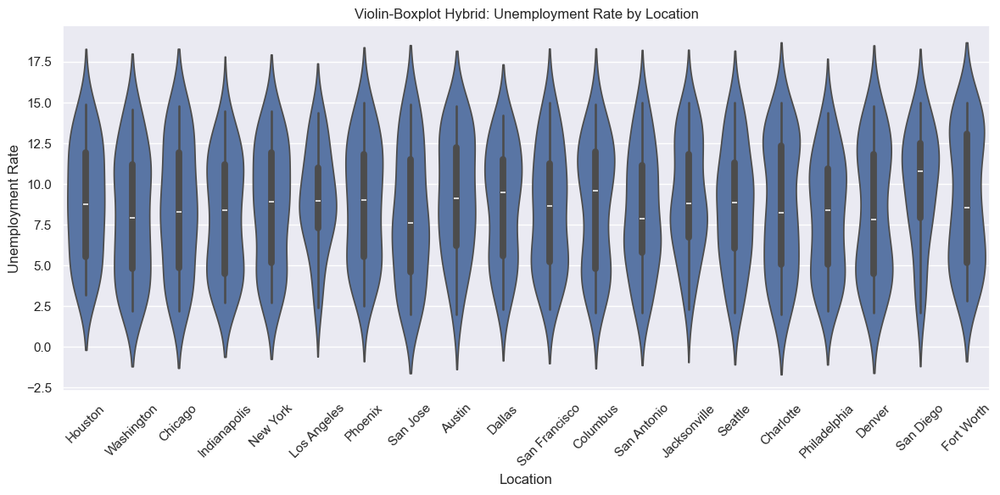

In [27]:
# Create violin-boxplot hybrid
plt.figure(figsize=(12, 6))
sns.violinplot(
    data=df,
    x="location",
    y="unemployment_rate",
    inner="box",   # shows the boxplot inside the violin
    scale="width"
)

plt.xticks(rotation=45)
plt.title("Violin-Boxplot Hybrid: Unemployment Rate by Location")
plt.xlabel("Location")
plt.ylabel("Unemployment Rate")
plt.tight_layout()

8. Plot a ternary diagram if you can identify three appropriate dimensions

In [28]:

# Normalize the three variables so their sum per row = 1
ternary_df = df.copy()
ternary_df["total"] = (
    ternary_df["college_degree_percentage"] +
    ternary_df["unemployment_rate"] +
    ternary_df["job_postings"]
)

ternary_df["A"] = ternary_df["college_degree_percentage"] / ternary_df["total"]
ternary_df["B"] = ternary_df["unemployment_rate"] / ternary_df["total"]
ternary_df["C"] = ternary_df["job_postings"] / ternary_df["total"]

# Optional: add labels (e.g., location or year)
ternary_df["label"] = ternary_df["location"] + " (" + ternary_df["date"] + ")"

# Plot the ternary diagram
fig = px.scatter_ternary(
    ternary_df,
    a="A", b="B", c="C",
    hover_name="label",
    title="Ternary Diagram: Education vs Unemployment vs Job Postings",
    color="location"
)
fig.show()

9. Visualize the data as a network graph of skill connections

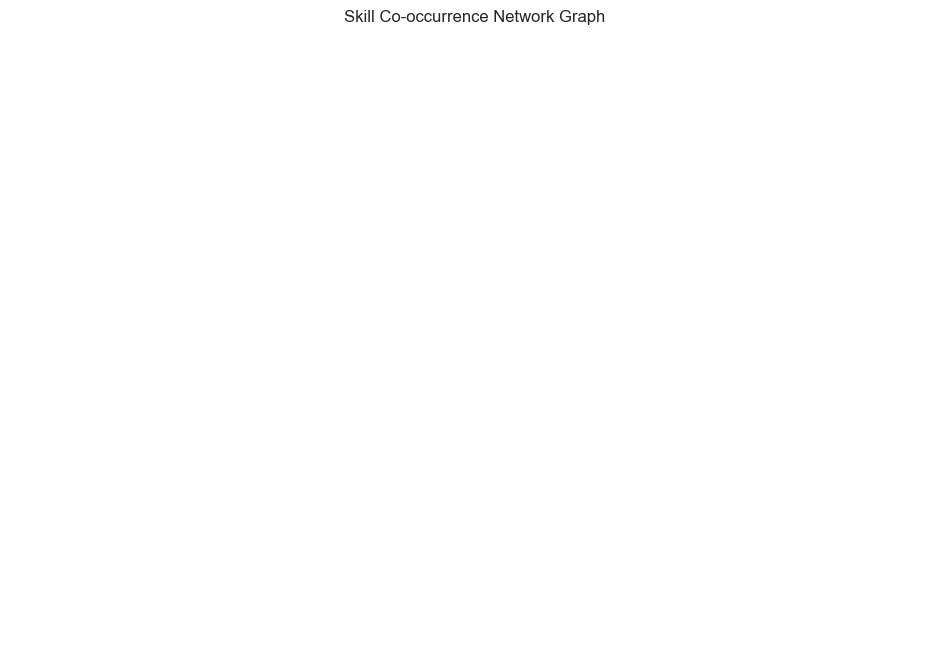

In [29]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from itertools import combinations
from collections import Counter


# Drop rows without skills
df = df.dropna(subset=["in_demand_skills"])

# Extract and clean skill lists
df["skill_list"] = df["in_demand_skills"].str.lower().str.split(",").apply(lambda x: [s.strip() for s in x])

# Count co-occurrences of skill pairs
pair_counter = Counter()
for skills in df["skill_list"]:
    unique_skills = list(set(skills))  # remove duplicates
    for pair in combinations(sorted(unique_skills), 2):  # unique pairs
        pair_counter[pair] += 1

# Create graph
G = nx.Graph()
for (skill1, skill2), weight in pair_counter.items():
    if weight >= 3:  # only keep stronger connections (adjust threshold as needed)
        G.add_edge(skill1, skill2, weight=weight)

# Draw graph
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G, k=0.5)
edges = G.edges()
weights = [G[u][v]['weight'] for u,v in edges]

nx.draw_networkx_nodes(G, pos, node_size=500, node_color='skyblue')
nx.draw_networkx_edges(G, pos, edgelist=edges, width=weights)
nx.draw_networkx_labels(G, pos, font_size=10)

plt.title("Skill Co-occurrence Network Graph")
plt.axis('off')
plt.show()


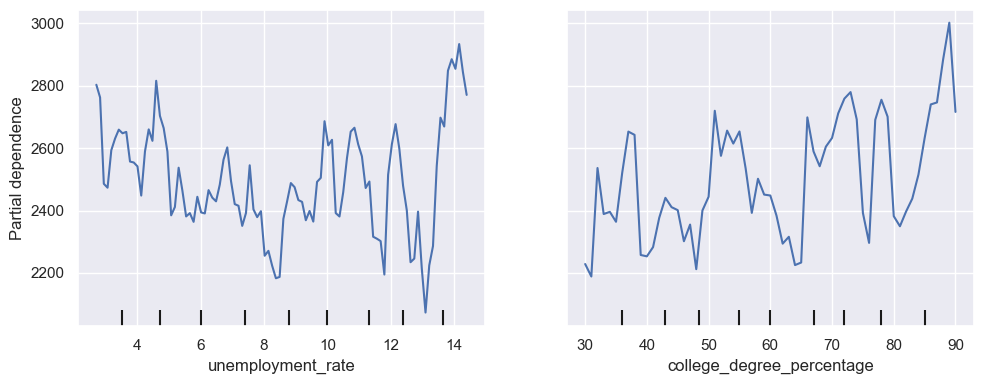

In [30]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.inspection import PartialDependenceDisplay
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt


# Select numeric features (you can choose others too)
features = ["unemployment_rate", "college_degree_percentage", "average_age"]
target = "job_postings"

# Drop rows with missing values
df = df.dropna(subset=features + [target])

# Prepare data
X = df[features]
y = df[target]

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

# Train model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Plot Partial Dependence
features_to_plot = ["unemployment_rate", "college_degree_percentage"]

fig, ax = plt.subplots(figsize=(10, 4))
PartialDependenceDisplay.from_estimator(model, X, features_to_plot, ax=ax)
plt.tight_layout()
plt.show()
